The code csegment includes all parts of the manuscript except for the social network analysis results. It includes loading the data, removing non-label tweets and multi-label tweets, volume analysis, and word cloud analysis

Social network analysis was performed using Gephi

In [1]:
# import necessary packages
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords, wordnet
import pandas as pd
import numpy as np
import gensim
import gensim.corpora as corpora
import re
import time
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

# the first six rows are irrelevant to our study. This information include the date of data collection, the name of the queries, etc
first_6_rows = [i for i in range(6)]

#Import data
data1 = pd.read_csv('01_20210618-20210731.csv',skiprows=first_6_rows)
data2 = pd.read_csv('1A_20210801-20210831.csv',skiprows=first_6_rows)
data3 = pd.read_csv('01B_20100630-20110430.csv',skiprows=first_6_rows)
data4 = pd.read_csv('02_20210429-20210617.csv',skiprows=first_6_rows)
data5 = pd.read_csv('2A_20210901-20210930.csv',skiprows=first_6_rows)
data6 = pd.read_csv('03_20210306-20210428.csv',skiprows=first_6_rows)
data7 = pd.read_csv('04_20210120-20210305.csv',skiprows=first_6_rows)
data8 = pd.read_csv('05_20201214-20210119.csv',skiprows=first_6_rows)
data9 = pd.read_csv('06_20201203-20201213.csv',skiprows=first_6_rows)
data10 = pd.read_csv('07_20201105-20201202.csv',skiprows=first_6_rows)
data11 = pd.read_csv('08_20200727-20201104.csv',skiprows=first_6_rows)
data12 = pd.read_csv('09_20200508-20200726.csv',skiprows=first_6_rows)
data13 = pd.read_csv('10_20200222-20200507.csv',skiprows=first_6_rows)
data14 = pd.read_csv('11_20191214-20200221.csv',skiprows=first_6_rows)
data15 = pd.read_csv('12_20190926-20191213.csv',skiprows=first_6_rows)
data16 = pd.read_csv('13_20190627-20190925.csv',skiprows=first_6_rows)
data17 = pd.read_csv('14_20190617-20200626.csv',skiprows=first_6_rows)
data18 = pd.read_csv('15_20190404-20190616.csv',skiprows=first_6_rows)
data19 = pd.read_csv('16_20190219-20190403.csv',skiprows=first_6_rows)
data20 = pd.read_csv('17_20181129-20210218.csv',skiprows=first_6_rows)
data21 = pd.read_csv('18_20180914-20181128.csv',skiprows=first_6_rows)
data22 = pd.read_csv('19_20180628-20180913.csv',skiprows=first_6_rows)
data23 = pd.read_csv('20_20180325-20180627.csv',skiprows=first_6_rows)
data24 = pd.read_csv('21_20180131-20180324.csv',skiprows=first_6_rows)
data25 = pd.read_csv('22_20170930-20180130.csv',skiprows=first_6_rows)
data26 = pd.read_csv('23_20170704-20170929.csv',skiprows=first_6_rows)
data27 = pd.read_csv('24_20170219-20170703.csv',skiprows=first_6_rows)
data28 = pd.read_csv('25_20160715-20170218.csv',skiprows=first_6_rows)
data29 = pd.read_csv('26_20160129-20160714.csv',skiprows=first_6_rows)
data30 = pd.read_csv('27_20150314-20160128.csv',skiprows=first_6_rows)
data31 = pd.read_csv('28_20130813-20150313.csv',skiprows=first_6_rows)
data32 = pd.read_csv('29_20130516-20130812.csv',skiprows=first_6_rows)
data33 = pd.read_csv('30_20110901-20130515.csv',skiprows=first_6_rows)
data34 = pd.read_csv('31_20110501-20110831.csv',skiprows=first_6_rows)
data35 = pd.read_csv('5A_20211201-20211231.csv',skiprows=first_6_rows)
data36 = pd.read_csv('4A_20211101-20211130.csv',skiprows=first_6_rows)
data37 = pd.read_csv('3A_20211001-20211031.csv',skiprows=first_6_rows)
data38 = pd.read_csv('9A_20220610-20220710.csv',skiprows=first_6_rows) 
data39 = pd.read_csv('10A_20220711-20220729.csv',skiprows=first_6_rows)
data40 = pd.read_csv('11A_20220730-20221006.csv',skiprows=first_6_rows)
data41 = pd.read_csv('12A_20221007-20221116.csv',skiprows=first_6_rows)
data42 = pd.read_csv('13A_20221117.csv',skiprows=first_6_rows)
data43 = pd.read_csv('14A_20221123-20221130.csv',skiprows=first_6_rows)
data44 = pd.read_csv('15A_20221118-20221120.csv',skiprows=first_6_rows)
data45 = pd.read_csv('16A_20221121-20221122.csv',skiprows=first_6_rows)
data46 = pd.read_csv('6A_20220101-20220227.csv',skiprows=first_6_rows)
data47 = pd.read_csv('7A_20220228-20220424.csv',skiprows=first_6_rows)
data48 = pd.read_csv('8A_202204225-20220609.csv',skiprows=first_6_rows)
data49 = pd.read_csv('17A_20221201-20221231.csv',skiprows=first_6_rows)

#     data35 to data 49 have more columns than other files. It's possible that during my
# data collectin process, Brandwatch altered the format and scope of the data being retrieved.
#     Remove these columns to make them consistent with other files.

data35 = data35.drop(columns=['Entity Info','Reddit Author Awardee Karma', 'Reddit Author Awarder Karma',
'Reddit Author Karma','Subreddit','Subreddit Subscribers'])
data36 = data36.drop(columns=['Reddit Author Awardee Karma', 'Reddit Author Awarder Karma',
'Reddit Author Karma','Subreddit','Subreddit Subscribers'])
data37 = data37.drop(columns=['Reddit Author Awardee Karma', 'Reddit Author Awarder Karma',
'Reddit Author Karma','Subreddit','Subreddit Subscribers'])
data38 = data38.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])

data39 = data39.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])

data40 = data40.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])

data41 = data41.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])
data42 = data42.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])
data43 = data43.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])
data44 = data44.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])
data45 = data45.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])

data46 = data46.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])

data47 = data47.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])

data48 = data48.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])

data49 = data49.drop(columns=['Twitter Likes','Air Type','Broadcast Media Url','Broadcast Type',
                               'Content Source','Content Source','Content Source Name','Entity Info',
                               'Is Syndicated','Media Type','Reddit Author Awardee Karma',
                               'Reddit Author Awarder Karma','Reddit Comments','Reddit Score Upvote Ratio',
                               'Subreddit','Subreddit Subscribers','Reddit Author Karma'])


alldata = [data1,data2,data3,data4,data5,data6,data7,data8,data9,data10,data11,data12,data13,
           data14,data15,data16,data17,data18,data19,data20,data21,data22,data23,data24,data25,
           data26,data27,data28,data29,data30,data31,data32,data33,data34,data35,data36,data37,
          data38,data39,data40,data41,data42,data43,data44,data45,data46,data47,data48,data49]


dataset_all = pd.concat(alldata,ignore_index=True)
dataset_all.sort_values("Date",inplace=True)
dataset_all = dataset_all.reset_index(drop=True)

/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3170: DtypeWarning: Columns (48,58,69,70) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


## Preprocessing For Label
### This step prepared the text for identifying labels. For example, 'in-vitro meat' will be converted to 'in vitro meat'; 'cultivated-meat' will be converted into 'cultivated meat'.

In [2]:
#preprocessing for label
dataset = dataset_all
import nltk
nltk.download('omw-1.4')
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
clean_text = []
for i,u in dataset.iterrows():
    word =''
    for words in str(u['Full Text']).split(): #tokenization
        words = words.replace('#',' ') #remove hashtag symbol
        words = words.replace('ȧ','a')
        words = re.sub(r'[^a-zA-Z]', ' ', words) #remove non-alphabetic characters
        if '#' not in words: #remove hashtag symbols
            if 'http:' not in words:#remove URLs
                word += (words+' ')
    doc = ''
    for token in word.split():
        token = token.lower()# lowercase form
        token = lemmatizer.lemmatize(token) #lemmatization
        doc += (token+' ')
    clean_text.append(doc)
dataset['processed for label']=[i for i in clean_text]

[nltk_data] Downloading package omw-1.4 to /Users/chen/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


# Classification of Tweets According to the Label Containing in the Tweets
### There are multi-label tweets (i.e., tweets containing more than one labels) and non-label tweets (i.e., tweets without any label) in the dataset

In [3]:
label_1_index = []
label_2_index = []
label_3_index = []
label_4_index = []
label_5_index = []
multilabel_index = []
nolabel_index = []
index = []
for i,v in dataset.iterrows():
    label_time = 0
    #print(v['processed for label'])
    if  "in vitro meat" in v['processed for label'] or 'invitromeat' in v['processed for label'] or 'invitro meat' in v['processed for label']:
        label_1_index.append(i)
        label_time += 1
        #print(1)
    if  "cell based meat" in v['processed for label'] or 'cellbasedmeat' in v['processed for label'] or 'cellbased meat' in v['processed for label']:
        label_2_index.append(i)
        label_time += 1
        #print(2)
    if "cultivated meat" in v['processed for label'] or 'cultivatedmeat'  in v['processed for label']:
        label_3_index.append(i)
        label_time += 1
        #print(3)
    if "cultured meat" in v['processed for label'] or 'culturedmeat' in v['processed for label']:
        label_4_index.append(i)
        label_time += 1
        #print(4)
    if "lab grown meat" in v['processed for label'] or 'labgrownmeat' in v['processed for label'] or 'labgrown meat' in v['processed for label']:
        label_5_index.append(i)
        label_time += 1
        #print(5)
    if label_time > 1:
        multilabel_index.append(i)
    elif label_time ==0:
        nolabel_index.append(i)

In [4]:
dataset['label1']=0
dataset['label2']=0
dataset['label3']=0
dataset['label4']=0
dataset['label5']=0
dataset['nolabel'] = 0
dataset['multilabel'] =0
dataset.loc[label_1_index,'label1'] = 1
dataset.loc[label_2_index,'label2'] = 1
dataset.loc[label_3_index,'label3'] = 1
dataset.loc[label_4_index,'label4'] = 1
dataset.loc[label_5_index,'label5'] = 1
dataset.loc[multilabel_index,'multilabel'] = 1
dataset.loc[nolabel_index,'nolabel'] = 1

In [5]:
dataset.groupby('multilabel')['Full Text'].count()

multilabel
0    414454
1      9928
Name: Full Text, dtype: int64

In [6]:
# add 'Year', 'Month', and 'Date' to the columns
year = []
for i,v in dataset.iterrows():
    year.append(v['Date'][:4])
dataset['Year'] = [i for i in year]

day = []
for i, v in dataset.iterrows():
    day.append(v['Date'][:10])
dataset['Day'] = [i for i in day]

month = []
for i, v in dataset.iterrows():
    month.append(v['Date'][:7])
dataset['Month'] = [i for i in month]

In [7]:
# the rows where 'nolabel' == 0 contain at least one of the five labels in the tweet text.
# This step removes all the non-label tweets.
containlabel = dataset.loc[(dataset['nolabel']==0)]
containlabel.shape

(370916, 110)

In [8]:
# the rows where 'multilabel' == 0 contain only one label (single-label tweets)
unique_label = containlabel.loc[containlabel['multilabel']==0]

In [9]:
label1_data = unique_label.loc[unique_label['label1']==1]
label2_data = unique_label.loc[unique_label['label2']==1]
label3_data = unique_label.loc[unique_label['label3']==1]
label4_data = unique_label.loc[unique_label['label4']==1]
label5_data = unique_label.loc[unique_label['label5']==1]

In [10]:
label1_month = label1_data.groupby('Month').size().reset_index(name='Count')
label2_month = label2_data.groupby('Month').size().reset_index(name='Count')
label3_month = label3_data.groupby('Month').size().reset_index(name='Count')
label4_month = label4_data.groupby('Month').size().reset_index(name='Count')
label5_month = label5_data.groupby('Month').size().reset_index(name='Count')

merged_data = label1_month.merge(label2_month, on='Month', how='outer', suffixes=('_label1', '_label2'))
merged_data = merged_data.merge(label3_month, on='Month', how='outer')
merged_data = merged_data.merge(label4_month, on='Month', how='outer', suffixes=('_label3', '_label4'))
merged_data = merged_data.merge(label5_month, on='Month', how='outer', suffixes=('', '_label5'))

# Replace NaN values with 0
merged_data.fillna(0, inplace=True)
merged_data = merged_data.sort_values('Month')
label_month_all = merged_data.reset_index(drop=True)

## Line chart (Fig. 2A)

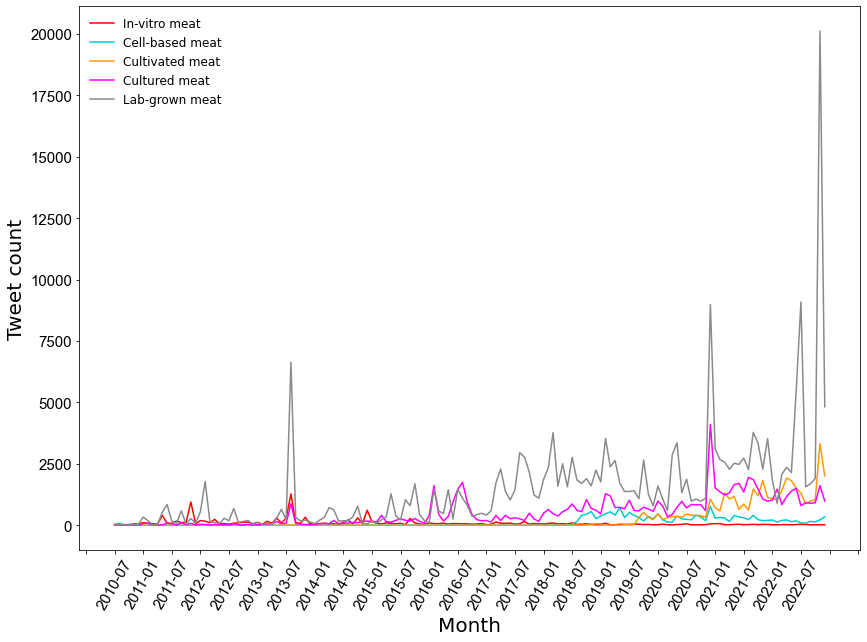

In [11]:
plt.figure(figsize=(14,10))

ax = plt.gca()
ax.xaxis.set_major_locator(MultipleLocator(6))

plt.plot(label_month_all['Month'],label_month_all['Count_label1'],label='In-vitro meat',color=(255/255,0/255,0/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label2'],label='Cell-based meat',color=(0/255,204/255,204/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label3'],label='Cultivated meat',color=(255/255,153/255,0/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label4'],label='Cultured meat',color=(255/255,0/255,255/255))
plt.plot(label_month_all['Month'],label_month_all['Count'],label='Lab-grown meat',color=(138/255,138/255,138/255))
#plt.axvline(x='2011-11',color='red',linestyle='--',label='2011-11')

#plt.axvline(x='2013-08', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2020-12', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2022-11', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2022-07', color='black', linestyle='--',linewidth=0.5)

plt.ylabel('Tweet count', fontsize=20)
plt.xlabel('Month', fontsize=20)
plt.legend(frameon=False, prop={'size': 12})
plt.xticks(rotation=60, fontsize=15, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.show()

## 3D graph (supplementary material Fig. 1)

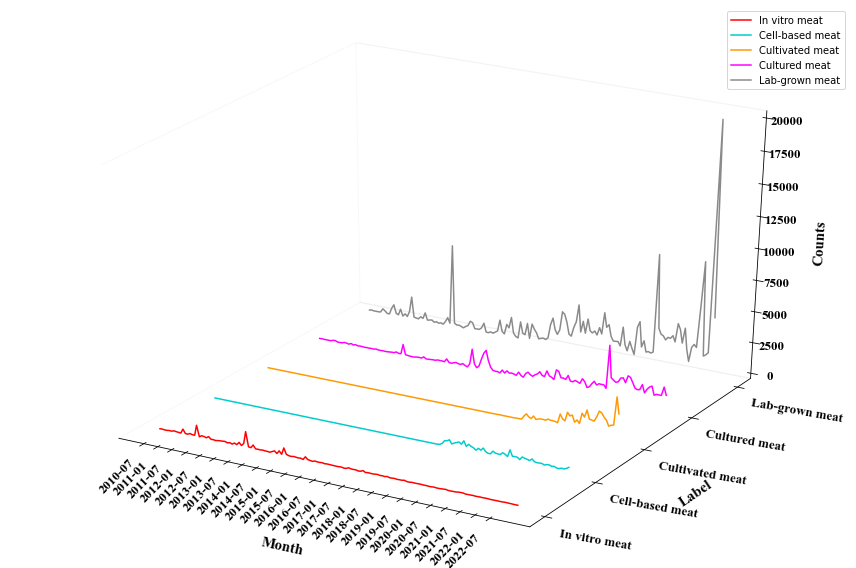

In [12]:
# Re-examining the code to ensure all labels are included in the plot

# Assuming df is the same dataframe as before
df = label_month_all

# Convert 'Month' to datetime and sort the dataframe by month
df['Month'] = pd.to_datetime(df['Month'])
df.sort_values('Month', inplace=True)

# Defining colors
colors = [
    (255/255, 0/255, 0/255),      # Red
    (0/255, 204/255, 204/255),    # Cyan
    (255/255, 153/255, 0/255),    # Orange
    (255/255, 0/255, 255/255),    # Magenta
    (138/255, 138/255, 138/255)   # Grey
]

# Extracting the labels and their frequencies
months = df['Month']
labels = ['In vitro meat', 'Cell-based meat', 'Cultivated meat', 'Cultured meat', 'Lab-grown meat']
df.columns = ['Month','In vitro meat', 'Cell-based meat', 'Cultivated meat', 'Cultured meat', 'Lab-grown meat']
  # Adjusting to skip the 'Unnamed: 0' column
frequencies = df[labels].values

# Creating a list of selected dates every six months starting from 2010-07
selected_dates = pd.date_range(start='2010-07', end=months.max(), freq='6M')
selected_date_str = [date.strftime('%Y-%m') for date in selected_dates]

# Filtering the months to include only those in selected_dates
filtered_month_indices = [i for i, month in enumerate(months) if month.strftime('%Y-%m') in selected_date_str]

# Preparing the data for 3D plotting
X, Y = np.meshgrid(range(len(months)), range(len(labels)))
Z = np.array(frequencies).T

# Re-plotting the 3D plot with all labels
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
ax.grid(False)
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Ensuring all labels are plotted
for i in range(len(labels)):
    ax.plot(X[i], Y[i], Z[i], label=labels[i], color=colors[i % len(colors)])

# Customizing the x and y ticks
ax.set_xticks(filtered_month_indices)
ax.set_xticklabels([months[i].strftime('%Y-%m') for i in filtered_month_indices], rotation=45, ha='right',fontname='Times New Roman',fontsize=13)
ax.set_yticks(range(len(labels)))
y_labels = ax.set_yticklabels(labels,rotation=-10, ha='right',fontname='Times New Roman',fontsize=13)
for label in y_labels:
    label.set_horizontalalignment('left')
z_tick_labels = ax.get_zticklabels()

# text
for label in z_tick_labels:
    label.set_fontsize(13)  # size
    label.set_fontname('Times New Roman')  # font

# Setting the labels for the axes

ax.set_xlabel('Month',labelpad=35,fontname='Times New Roman',fontsize=15)
ax.set_ylabel('Label',labelpad=25,fontname='Times New Roman',fontsize=15)
ax.set_zlabel('Counts',labelpad=15,fontname='Times New Roman',fontsize=15)
# Adding legend and title
ax.legend()
#ax.set_title('3D Plot of Label Frequencies Over Time')

# Show the plot
plt.tight_layout()
plt.show()

# Pie Chart (Fig. 2B)

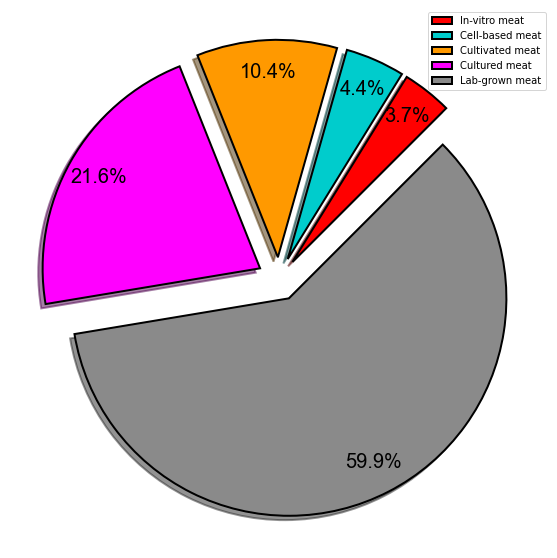

In [13]:
total_counts = merged_data[['Count_label1', 'Count_label2', 'Count_label3', 'Count_label4','Count']].sum()
fig = plt.figure(figsize=(10,10))
colors = ('#FF0000','#00CCCC','#FF9900','#FF00FF','#8A8A8A')
wp = {'linewidth':2, 'edgecolor':'black'}
data = total_counts
explode = (0.1,0.1,0.1,0.1,0.1)
textprops = {"fontsize": 20, "color": "black",'fontname':'Arial'} 
classes = ['In-vitro meat','Cell-based meat','Cultivated meat','Cultured meat','Lab-grown meat']
patches, texts, autotexts = plt.pie(data, autopct="%0.1f%%", labels=None, startangle=45,colors=colors, 
                                    explode=explode, shadow=True, wedgeprops=wp,  pctdistance=0.85)

# 
for text in autotexts:
    text.set_fontsize(20)
    text.set_fontname('Arial')

# 
plt.legend(patches, classes, loc="best")

plt.show()

## Label usage patterns of Good Food Institute (GFI) (Supplementary material Fig. 2A)

In [14]:
label1_GFI = label1_data.loc[label1_data['Author']=='GoodFoodInst']
label2_GFI = label2_data.loc[label2_data['Author']=='GoodFoodInst']
label3_GFI = label3_data.loc[label3_data['Author']=='GoodFoodInst']
label4_GFI = label4_data.loc[label4_data['Author']=='GoodFoodInst']
label5_GFI = label5_data.loc[label5_data['Author']=='GoodFoodInst']

label1_month = label1_GFI.groupby('Month').size().reset_index(name='Count')
label2_month = label2_GFI.groupby('Month').size().reset_index(name='Count')
label3_month = label3_GFI.groupby('Month').size().reset_index(name='Count')
label4_month = label4_GFI.groupby('Month').size().reset_index(name='Count')
label5_month = label5_GFI.groupby('Month').size().reset_index(name='Count')

merged_data = label1_month.merge(label2_month, on='Month', how='outer', suffixes=('_label1', '_label2'))
merged_data = merged_data.merge(label3_month, on='Month', how='outer')
merged_data = merged_data.merge(label4_month, on='Month', how='outer', suffixes=('_label3', '_label4'))
merged_data = merged_data.merge(label5_month, on='Month', how='outer', suffixes=('', '_label5'))

# Replace NaN values with 0
merged_data.fillna(0, inplace=True)
merged_data = merged_data.sort_values('Month')
label_month_all = merged_data.reset_index(drop=True)

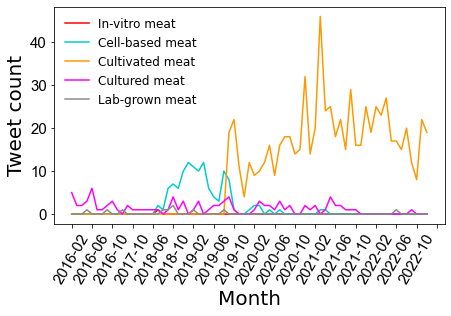

In [15]:
# Defining colors
colors = [
    (255/255, 0/255, 0/255),      # Red
    (0/255, 204/255, 204/255),    # Cyan
    (255/255, 153/255, 0/255),    # Orange
    (255/255, 0/255, 255/255),    # Magenta
    (138/255, 138/255, 138/255)   # Grey
]

# Extracting the labels and their frequencies
import matplotlib.pyplot as plt
plt.figure(figsize=(7,4))
ax = plt.gca()
ax.xaxis.set_major_locator(MultipleLocator(4))

plt.plot(label_month_all['Month'],label_month_all['Count_label1'],label='In-vitro meat',color=(255/255,0/255,0/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label2'],label='Cell-based meat',color=(0/255,204/255,204/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label3'],label='Cultivated meat',color=(255/255,153/255,0/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label4'],label='Cultured meat',color=(255/255,0/255,255/255))
plt.plot(label_month_all['Month'],label_month_all['Count'],label='Lab-grown meat',color=(138/255,138/255,138/255))
#plt.axvline(x='2011-11',color='red',linestyle='--',label='2011-11')

#plt.axvline(x='2013-08', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2020-12', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2022-11', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2022-07', color='black', linestyle='--',linewidth=0.5)

plt.ylabel('Tweet count', fontsize=20)
plt.xlabel('Month', fontsize=20)
plt.legend(frameon=False, prop={'size': 12})
plt.xticks(rotation=60, fontsize=15, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.show()

## Label usage patterns of New Harvest (Supplementary material Fig. 2A)

In [16]:
label1_NH = label1_data.loc[label1_data['Author']=='NewHarvestOrg']
label2_NH = label2_data.loc[label2_data['Author']=='NewHarvestOrg']
label3_NH = label3_data.loc[label3_data['Author']=='NewHarvestOrg']
label4_NH = label4_data.loc[label4_data['Author']=='NewHarvestOrg']
label5_NH = label5_data.loc[label5_data['Author']=='NewHarvestOrg']

label1_month = label1_NH.groupby('Month').size().reset_index(name='Count')
label2_month = label2_NH.groupby('Month').size().reset_index(name='Count')
label3_month = label3_NH.groupby('Month').size().reset_index(name='Count')
label4_month = label4_NH.groupby('Month').size().reset_index(name='Count')
label5_month = label5_NH.groupby('Month').size().reset_index(name='Count')

merged_data = label1_month.merge(label2_month, on='Month', how='outer', suffixes=('_label1', '_label2'))
merged_data = merged_data.merge(label3_month, on='Month', how='outer')
merged_data = merged_data.merge(label4_month, on='Month', how='outer', suffixes=('_label3', '_label4'))
merged_data = merged_data.merge(label5_month, on='Month', how='outer', suffixes=('', '_label5'))

# Replace NaN values with 0
merged_data.fillna(0, inplace=True)
merged_data = merged_data.sort_values('Month')
label_month_all = merged_data.reset_index(drop=True)

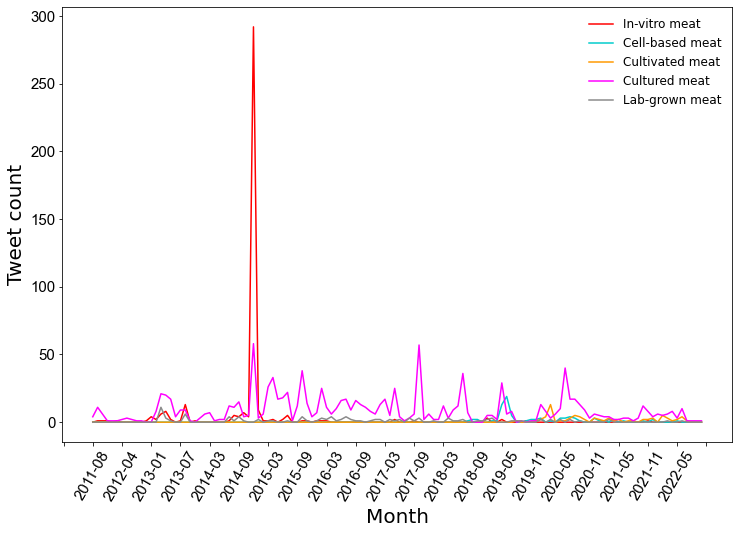

In [17]:
# Defining colors
colors = [
    (255/255, 0/255, 0/255),      # Red
    (0/255, 204/255, 204/255),    # Cyan
    (255/255, 153/255, 0/255),    # Orange
    (255/255, 0/255, 255/255),    # Magenta
    (138/255, 138/255, 138/255)   # Grey
]

# Extracting the labels and their frequencies
import matplotlib.pyplot as plt
plt.figure(figsize=(12,8))
ax = plt.gca()
ax.xaxis.set_major_locator(MultipleLocator(6))

plt.plot(label_month_all['Month'],label_month_all['Count_label1'],label='In-vitro meat',color=(255/255,0/255,0/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label2'],label='Cell-based meat',color=(0/255,204/255,204/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label3'],label='Cultivated meat',color=(255/255,153/255,0/255))
plt.plot(label_month_all['Month'],label_month_all['Count_label4'],label='Cultured meat',color=(255/255,0/255,255/255))
plt.plot(label_month_all['Month'],label_month_all['Count'],label='Lab-grown meat',color=(138/255,138/255,138/255))

#plt.axvline(x='2013-08', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2020-12', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2022-11', color='black', linestyle='--',linewidth=0.5)
#plt.axvline(x='2022-07', color='black', linestyle='--',linewidth=0.5)

plt.ylabel('Tweet count', fontsize=20)
plt.xlabel('Month', fontsize=20)
plt.legend(frameon=False, prop={'size': 12})
plt.xticks(rotation=60, fontsize=15, fontname='Arial')
plt.yticks(fontsize=15, fontname='Arial')
plt.show()

# Retweet?

In [18]:
RT = []
for i, v in unique_label.iterrows():
    if v['Title'].startswith('RT @'):
        RT.append(1)
    else:
        RT.append(0)
unique_label['RT'] = [i for i in RT]

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [19]:
RT_singlelabel = unique_label.loc[unique_label['RT']==1]
RT_singlelabel = RT_singlelabel.reset_index(drop=True)
noRT_singlelabel = unique_label.loc[unique_label['RT']==0]
noRT_singlelabel = noRT_singlelabel.reset_index(drop=True)

# Text preprocessing for word cloud analysis

In [20]:
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
start_time = time.time()
stop_words = stopwords.words('english')
stop_words += ['meat','lab','grown','cultured','vitro','cell','based','cultivated','cultivatedmeat','culturedmeat',
              'cellbasedmeat','labgrownmeat','invitromeat']
b = []
for i,u in noRT_singlelabel.iterrows():
    a = []
    word =''
    for words in str(u['Full Text']).split(): #tokenization
        if '@' not in words: #remove @users
            words = words.replace('#','') #remove hashtag symbol
            if '#' not in words:
                if 'http' not in words: #remove URLs
                    if'&amp' not in words: #remove symbol
                        words = re.sub(r'[^a-zA-Z]', ' ', words)#remove non-alphabetic characters
                        if len(words)>2:
                            word += (words+' ')
    doc = ''
    for token in word.split():
        if len(token) >2: # remove words that have less than 3 characters
            token = token.lower()# lowercase form
            if token not in stop_words:# remove stop words
                token = lemmatizer.lemmatize(token) #Lemmatize
                doc += (token+' ')
    b.append(doc)
noRT_singlelabel['processed']=[i for i in b]
end_time = time.time()
print('Data Preprocessing cost: ',end_time-start_time,'s',sep='')

Data Preprocessing cost: 63.03170919418335s


In [21]:
dataset_label1 = noRT_singlelabel.loc[noRT_singlelabel['label1']==1]
dataset_label2 = noRT_singlelabel.loc[noRT_singlelabel['label2']==1]
dataset_label3 = noRT_singlelabel.loc[noRT_singlelabel['label3']==1]
dataset_label4 = noRT_singlelabel.loc[noRT_singlelabel['label4']==1]
dataset_label5 = noRT_singlelabel.loc[noRT_singlelabel['label5']==1]

In [22]:
dataset_label1_2010 = dataset_label1.loc[dataset_label1['Year']=='2010']
dataset_label1_2011 = dataset_label1.loc[dataset_label1['Year']=='2011']
dataset_label1_2012 = dataset_label1.loc[dataset_label1['Year']=='2012']
dataset_label1_2013 = dataset_label1.loc[dataset_label1['Year']=='2013']
dataset_label1_2014 = dataset_label1.loc[dataset_label1['Year']=='2014']
dataset_label1_2015 = dataset_label1.loc[dataset_label1['Year']=='2015']
dataset_label1_2016 = dataset_label1.loc[dataset_label1['Year']=='2016']
dataset_label1_2017 = dataset_label1.loc[dataset_label1['Year']=='2017']
dataset_label1_2018 = dataset_label1.loc[dataset_label1['Year']=='2018']
dataset_label1_2019 = dataset_label1.loc[dataset_label1['Year']=='2019']
dataset_label1_2020 = dataset_label1.loc[dataset_label1['Year']=='2020']
dataset_label1_2021 = dataset_label1.loc[dataset_label1['Year']=='2021']
dataset_label1_2022 = dataset_label1.loc[dataset_label1['Year']=='2022']

dataset_label2_2010 = dataset_label2.loc[dataset_label2['Year']=='2010']
dataset_label2_2011 = dataset_label2.loc[dataset_label2['Year']=='2011']
dataset_label2_2012 = dataset_label2.loc[dataset_label2['Year']=='2012']
dataset_label2_2013 = dataset_label2.loc[dataset_label2['Year']=='2013']
dataset_label2_2014 = dataset_label2.loc[dataset_label2['Year']=='2014']
dataset_label2_2015 = dataset_label2.loc[dataset_label2['Year']=='2015']
dataset_label2_2016 = dataset_label2.loc[dataset_label2['Year']=='2016']
dataset_label2_2017 = dataset_label2.loc[dataset_label2['Year']=='2017']
dataset_label2_2018 = dataset_label2.loc[dataset_label2['Year']=='2018']
dataset_label2_2019 = dataset_label2.loc[dataset_label2['Year']=='2019']
dataset_label2_2020 = dataset_label2.loc[dataset_label2['Year']=='2020']
dataset_label2_2021 = dataset_label2.loc[dataset_label2['Year']=='2021']
dataset_label2_2022 = dataset_label2.loc[dataset_label2['Year']=='2022']

dataset_label3_2010 = dataset_label3.loc[dataset_label3['Year']=='2010']
dataset_label3_2011 = dataset_label3.loc[dataset_label3['Year']=='2011']
dataset_label3_2012 = dataset_label3.loc[dataset_label3['Year']=='2012']
dataset_label3_2013 = dataset_label3.loc[dataset_label3['Year']=='2013']
dataset_label3_2014 = dataset_label3.loc[dataset_label3['Year']=='2014']
dataset_label3_2015 = dataset_label3.loc[dataset_label3['Year']=='2015']
dataset_label3_2016 = dataset_label3.loc[dataset_label3['Year']=='2016']
dataset_label3_2017 = dataset_label3.loc[dataset_label3['Year']=='2017']
dataset_label3_2018 = dataset_label3.loc[dataset_label3['Year']=='2018']
dataset_label3_2019 = dataset_label3.loc[dataset_label3['Year']=='2019']
dataset_label3_2020 = dataset_label3.loc[dataset_label3['Year']=='2020']
dataset_label3_2021 = dataset_label3.loc[dataset_label3['Year']=='2021']
dataset_label3_2022 = dataset_label3.loc[dataset_label3['Year']=='2022']

dataset_label4_2010 = dataset_label4.loc[dataset_label4['Year']=='2010']
dataset_label4_2011 = dataset_label4.loc[dataset_label4['Year']=='2011']
dataset_label4_2012 = dataset_label4.loc[dataset_label4['Year']=='2012']
dataset_label4_2013 = dataset_label4.loc[dataset_label4['Year']=='2013']
dataset_label4_2014 = dataset_label4.loc[dataset_label4['Year']=='2014']
dataset_label4_2015 = dataset_label4.loc[dataset_label4['Year']=='2015']
dataset_label4_2016 = dataset_label4.loc[dataset_label4['Year']=='2016']
dataset_label4_2017 = dataset_label4.loc[dataset_label4['Year']=='2017']
dataset_label4_2018 = dataset_label4.loc[dataset_label4['Year']=='2018']
dataset_label4_2019 = dataset_label4.loc[dataset_label4['Year']=='2019']
dataset_label4_2020 = dataset_label4.loc[dataset_label4['Year']=='2020']
dataset_label4_2021 = dataset_label4.loc[dataset_label4['Year']=='2021']
dataset_label4_2022 = dataset_label4.loc[dataset_label4['Year']=='2022']

dataset_label5_2010 = dataset_label5.loc[dataset_label5['Year']=='2010']
dataset_label5_2011 = dataset_label5.loc[dataset_label5['Year']=='2011']
dataset_label5_2012 = dataset_label5.loc[dataset_label5['Year']=='2012']
dataset_label5_2013 = dataset_label5.loc[dataset_label5['Year']=='2013']
dataset_label5_2014 = dataset_label5.loc[dataset_label5['Year']=='2014']
dataset_label5_2015 = dataset_label5.loc[dataset_label5['Year']=='2015']
dataset_label5_2016 = dataset_label5.loc[dataset_label5['Year']=='2016']
dataset_label5_2017 = dataset_label5.loc[dataset_label5['Year']=='2017']
dataset_label5_2018 = dataset_label5.loc[dataset_label5['Year']=='2018']
dataset_label5_2019 = dataset_label5.loc[dataset_label5['Year']=='2019']
dataset_label5_2020 = dataset_label5.loc[dataset_label5['Year']=='2020']
dataset_label5_2021 = dataset_label5.loc[dataset_label5['Year']=='2021']
dataset_label5_2022 = dataset_label5.loc[dataset_label5['Year']=='2022']

In [23]:
from wordcloud import WordCloud

## Label 1 (in-vitro meat) overall wordcloud (Fig. 3A)

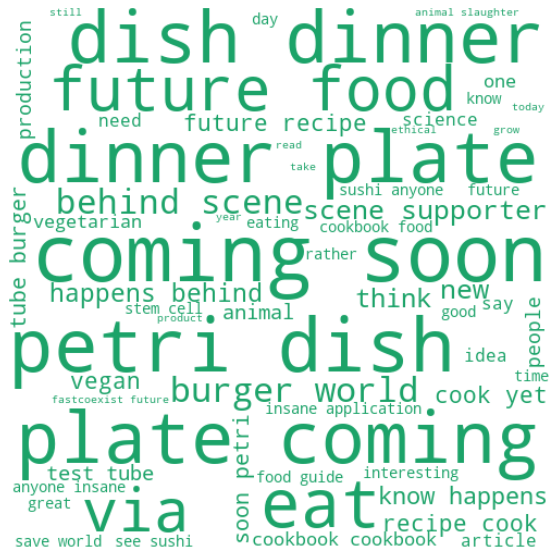

In [24]:
text = " ".join(i for i in dataset_label1.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 1 (in-vitro meat) yearly word clouds (supplementary material Fig. 3)

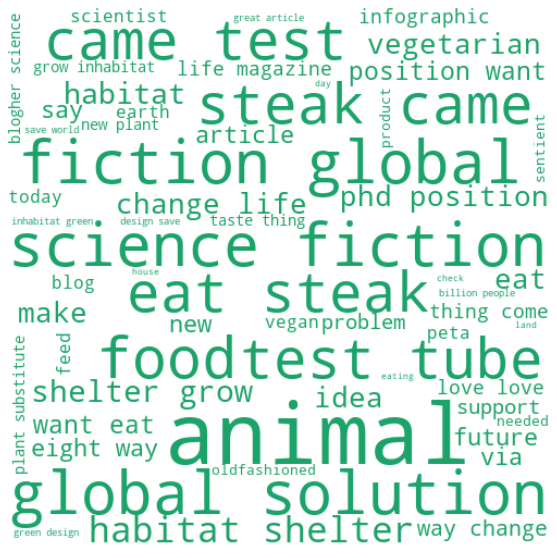

In [25]:
text = " ".join(i for i in dataset_label1_2010.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

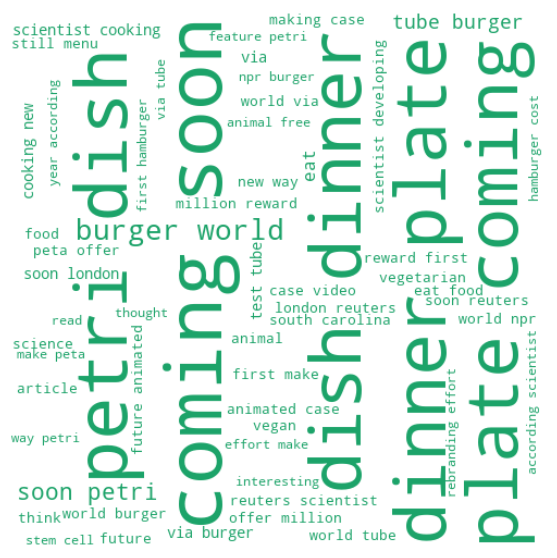

In [26]:
text = " ".join(i for i in dataset_label1_2011.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

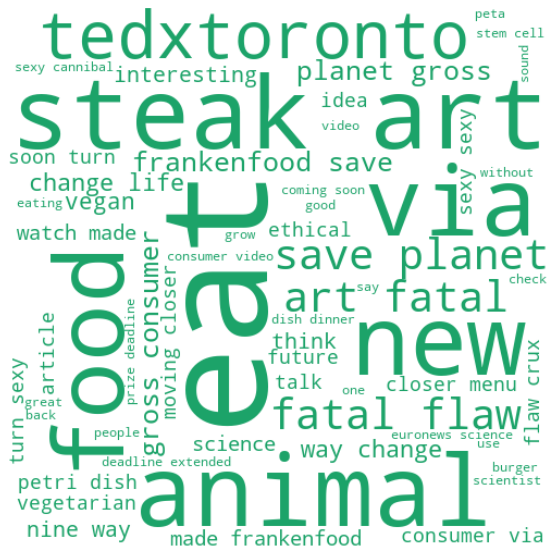

In [27]:
text = " ".join(i for i in dataset_label1_2012.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

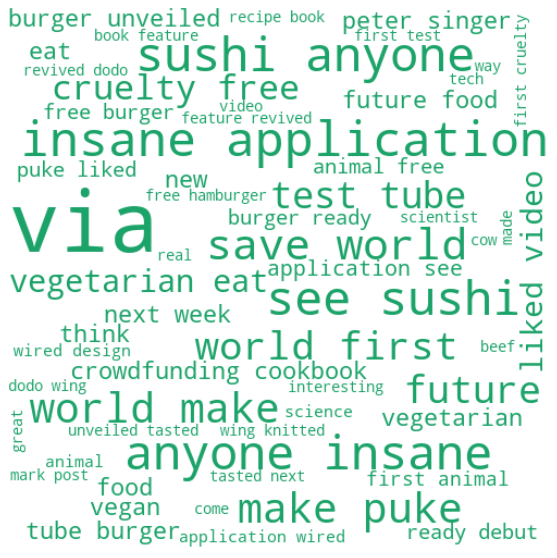

In [28]:
text = " ".join(i for i in dataset_label1_2013.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

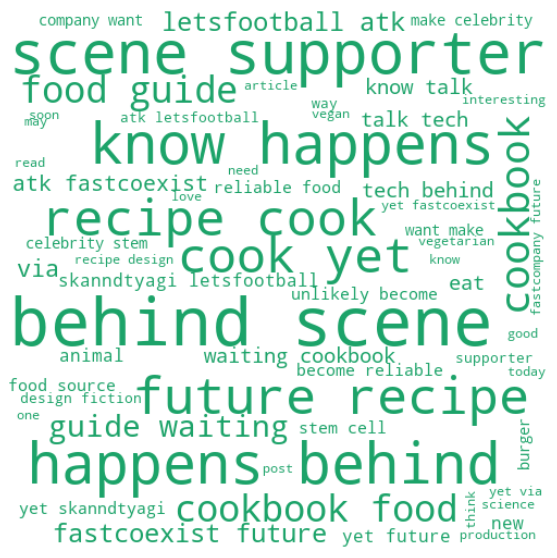

In [29]:
text = " ".join(i for i in dataset_label1_2014.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

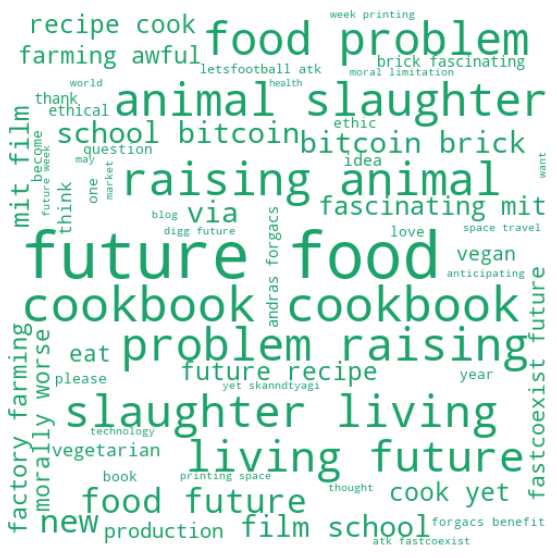

In [30]:
text = " ".join(i for i in dataset_label1_2015.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

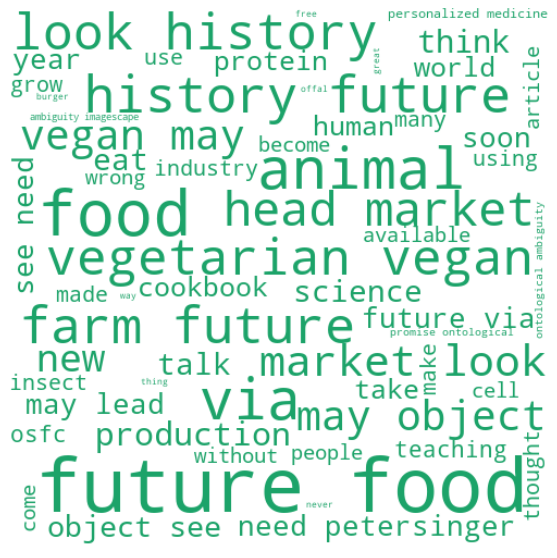

In [31]:
text = " ".join(i for i in dataset_label1_2016.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

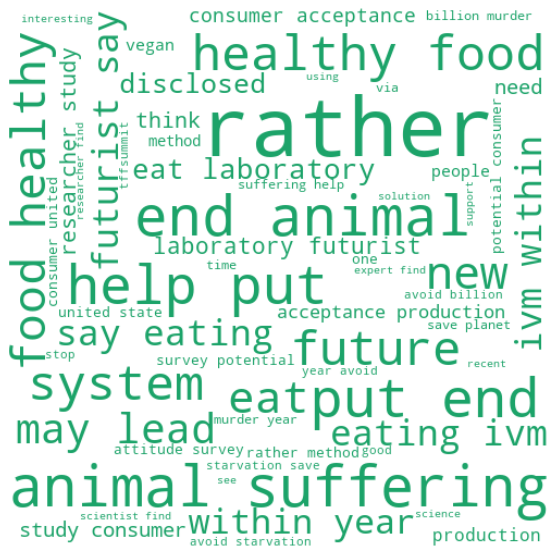

In [32]:
text = " ".join(i for i in dataset_label1_2017.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

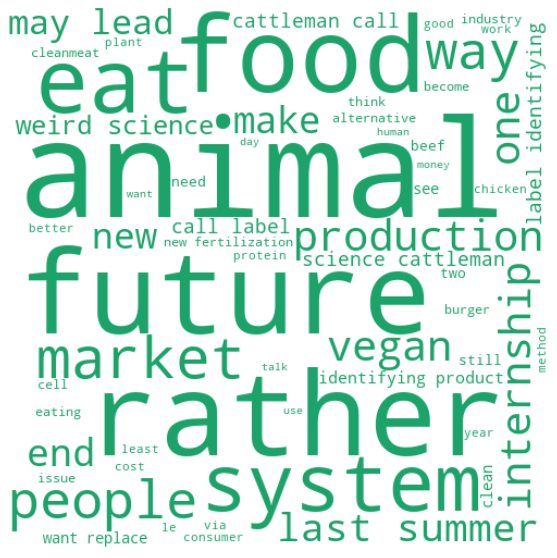

In [33]:
text = " ".join(i for i in dataset_label1_2018.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

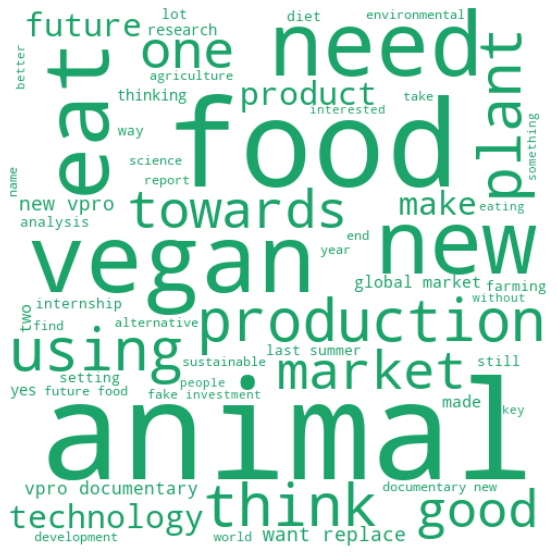

In [34]:
text = " ".join(i for i in dataset_label1_2019.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

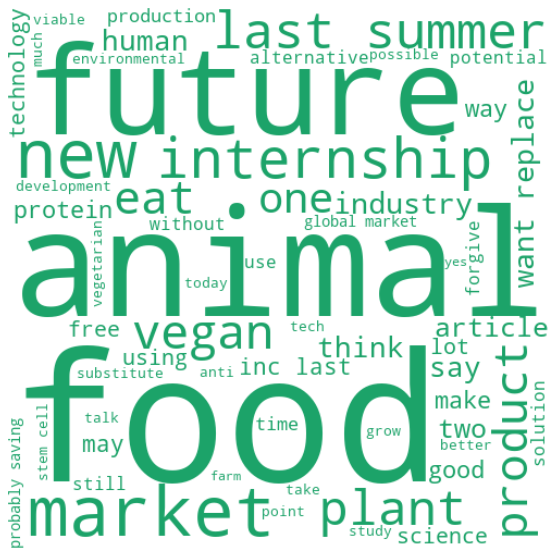

In [35]:
text = " ".join(i for i in dataset_label1_2020.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

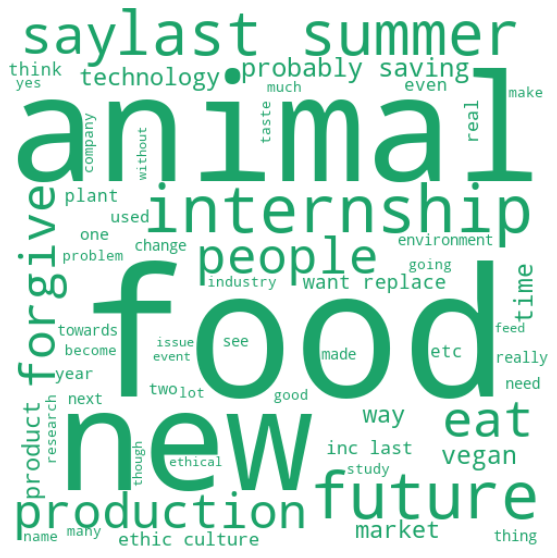

In [36]:
text = " ".join(i for i in dataset_label1_2021.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

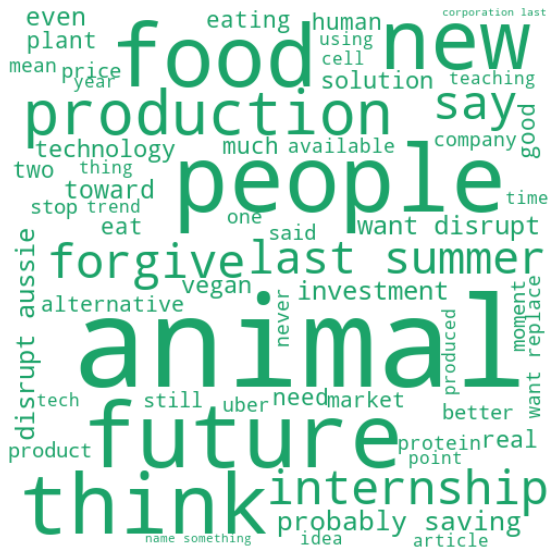

In [37]:
text = " ".join(i for i in dataset_label1_2022.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 2 (cell-based meat) overall word cloud (Fig. 3B)

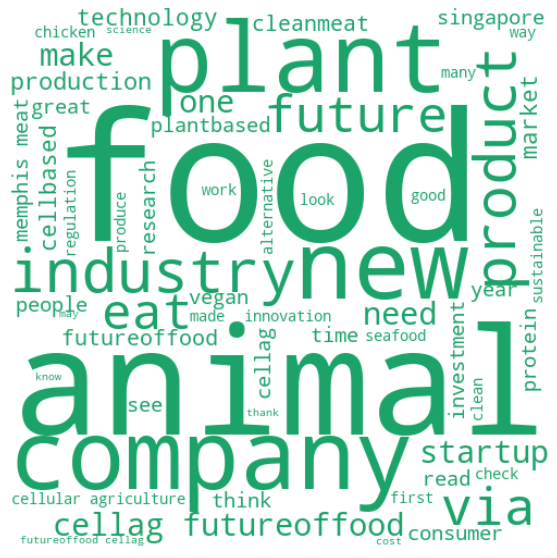

In [38]:
text = " ".join(i for i in dataset_label2.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 2 (cell-based meat) yearly word clouds (supplementary material Fig 4)

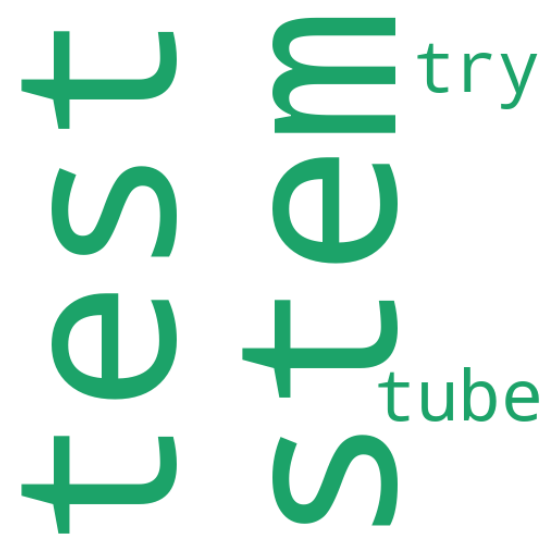

In [39]:
text = " ".join(i for i in dataset_label2_2013.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

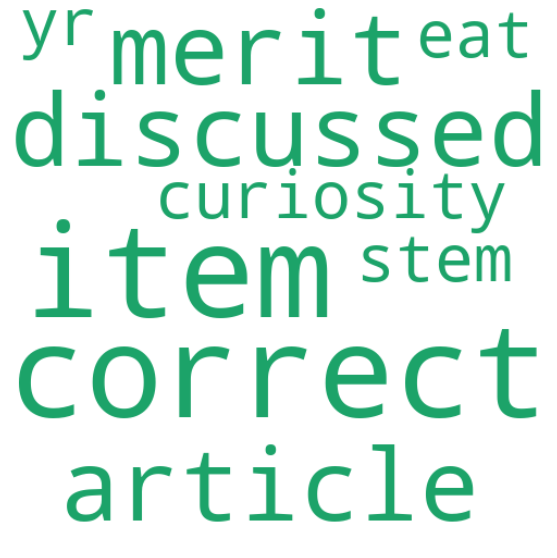

In [40]:
text = " ".join(i for i in dataset_label2_2014.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

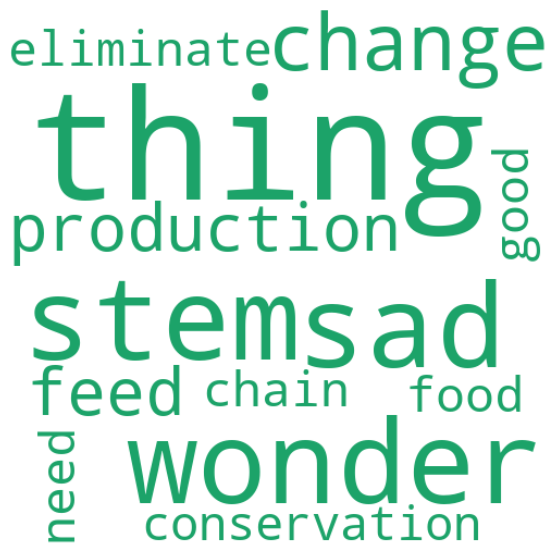

In [41]:
text = " ".join(i for i in dataset_label2_2015.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

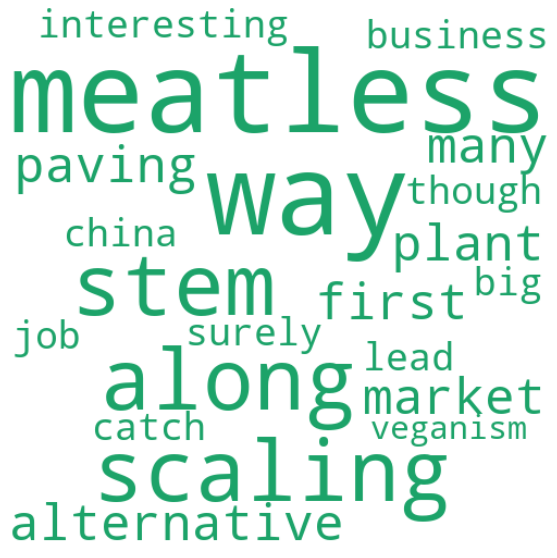

In [42]:
text = " ".join(i for i in dataset_label2_2017.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

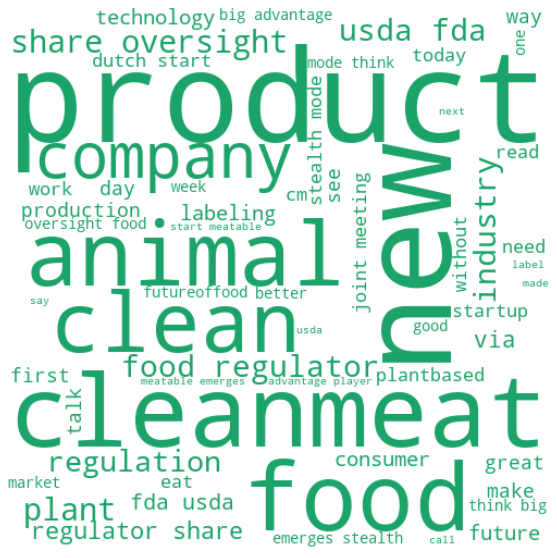

In [43]:
text = " ".join(i for i in dataset_label2_2018.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

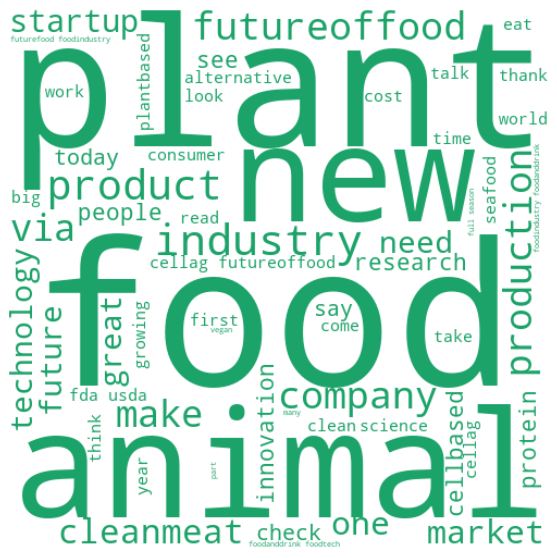

In [44]:
text = " ".join(i for i in dataset_label2_2019.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

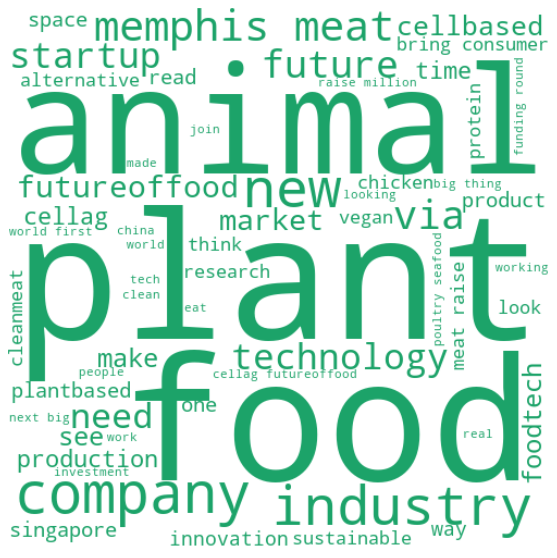

In [45]:
text = " ".join(i for i in dataset_label2_2020.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

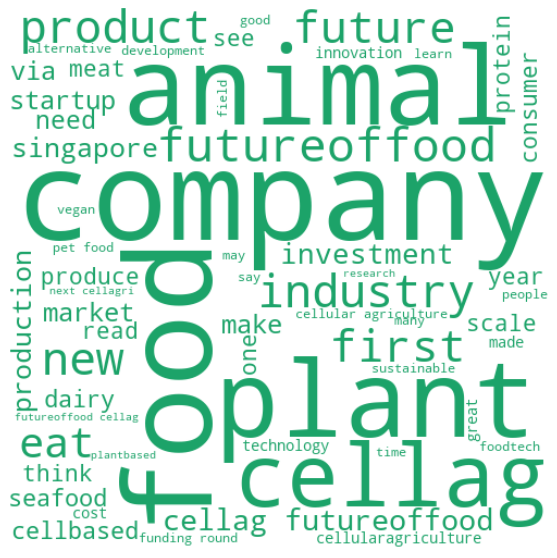

In [46]:
text = " ".join(i for i in dataset_label2_2021.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

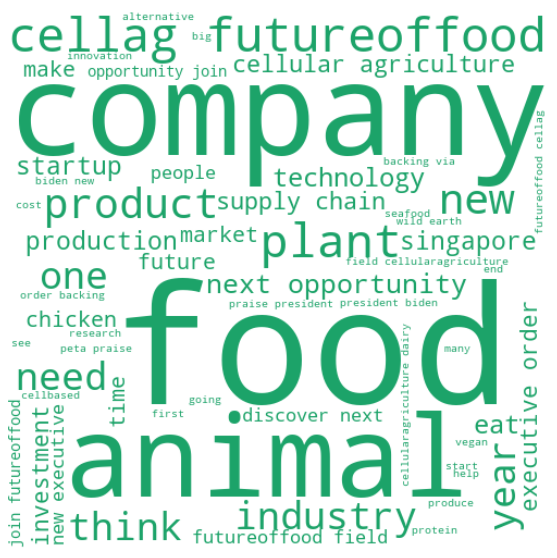

In [47]:
text = " ".join(i for i in dataset_label2_2022.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 3 (cultivated meat) overall word clouds (Fig. 3C)

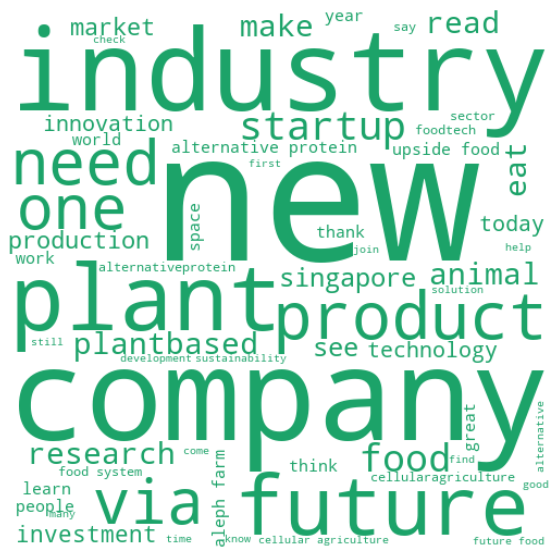

In [48]:
text = " ".join(i for i in dataset_label3.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 3 (cultivated meat) yearly word clouds (supplementary material Fig. 5)

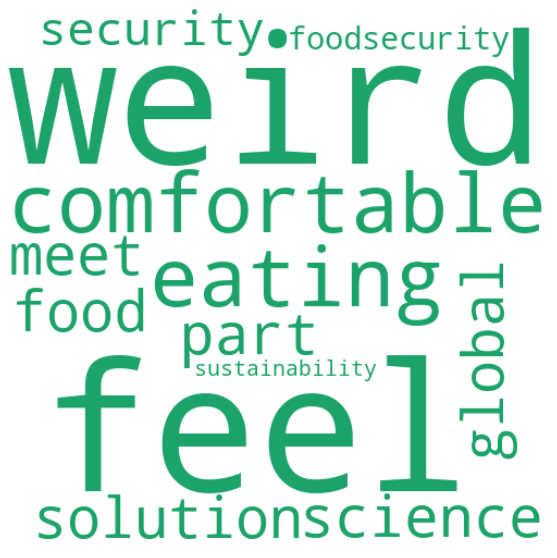

In [49]:
text = " ".join(i for i in dataset_label3_2010.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

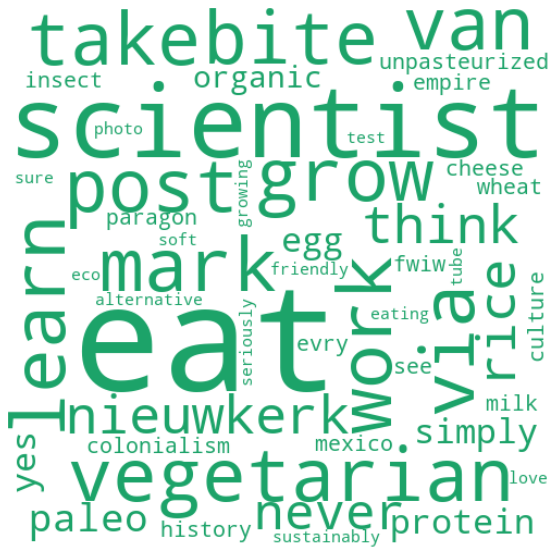

In [50]:
text = " ".join(i for i in dataset_label3_2011.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

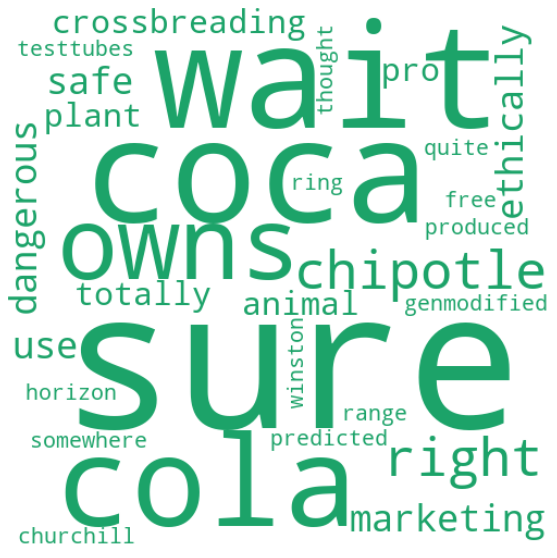

In [51]:
text = " ".join(i for i in dataset_label3_2012.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

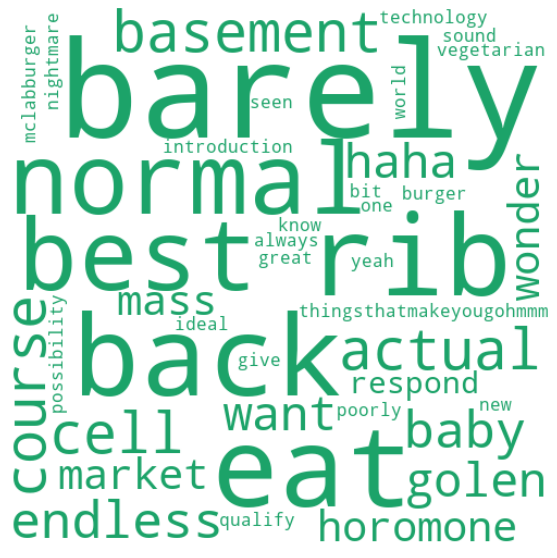

In [52]:
text = " ".join(i for i in dataset_label3_2013.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

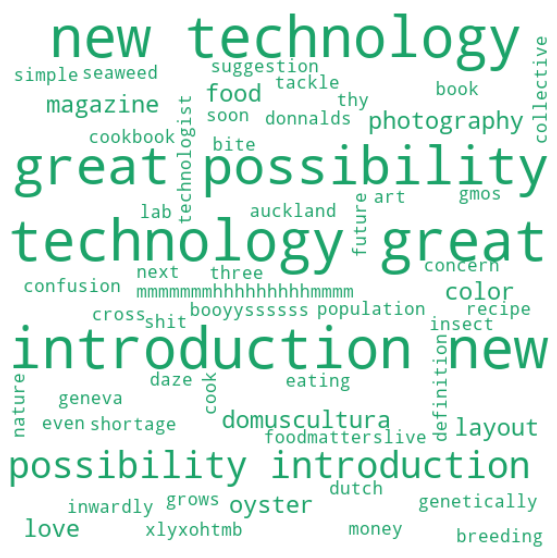

In [53]:
text = " ".join(i for i in dataset_label3_2014.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

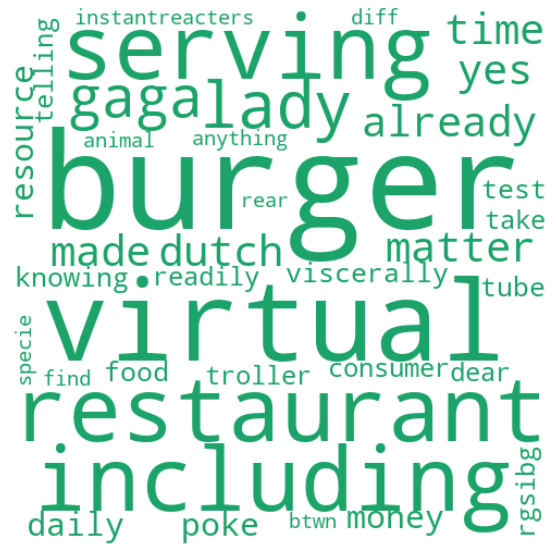

In [54]:
text = " ".join(i for i in dataset_label3_2015.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

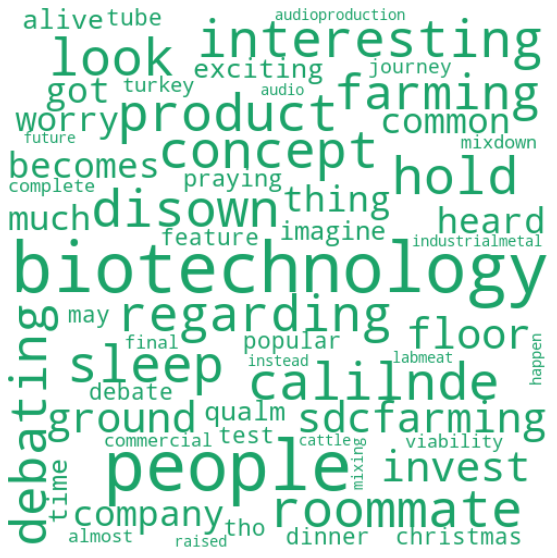

In [55]:
text = " ".join(i for i in dataset_label3_2016.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

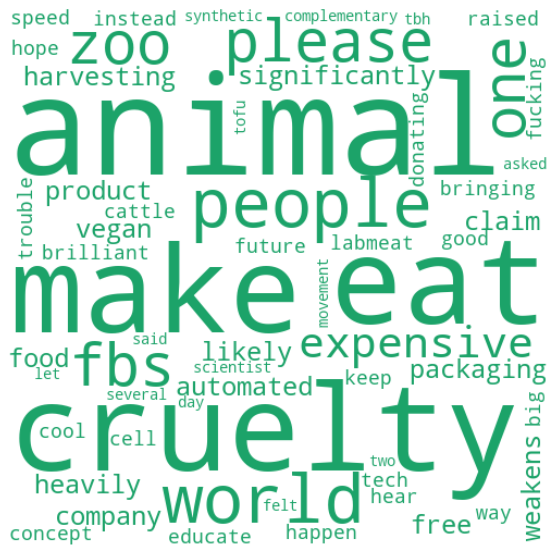

In [56]:
text = " ".join(i for i in dataset_label3_2017.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

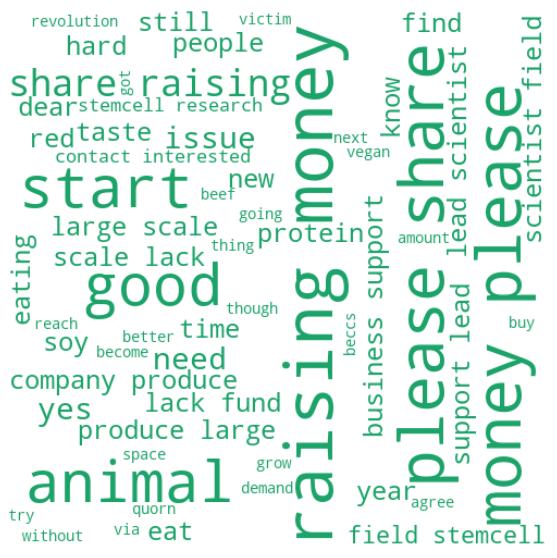

In [57]:
text = " ".join(i for i in dataset_label3_2018.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

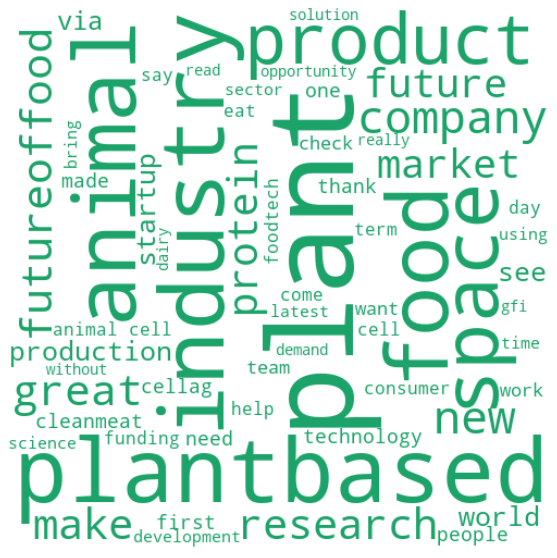

In [58]:
text = " ".join(i for i in dataset_label3_2019.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

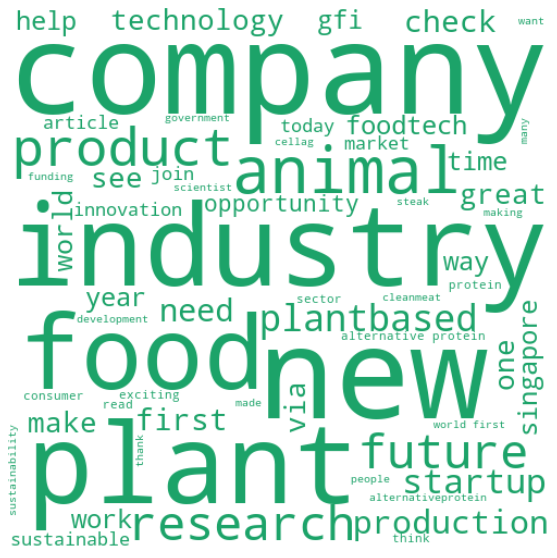

In [59]:
text = " ".join(i for i in dataset_label3_2020.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

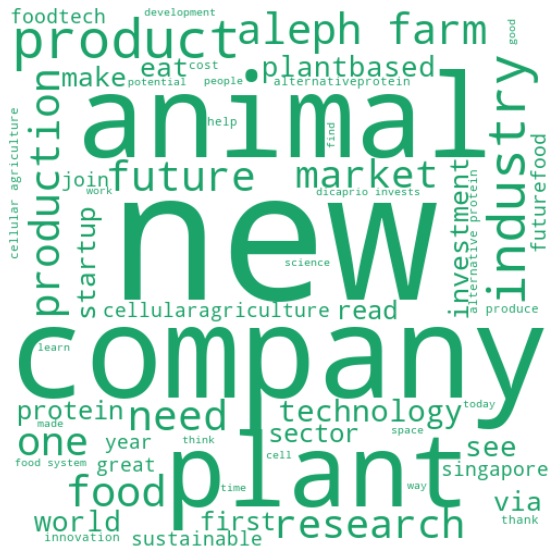

In [60]:
text = " ".join(i for i in dataset_label3_2021.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

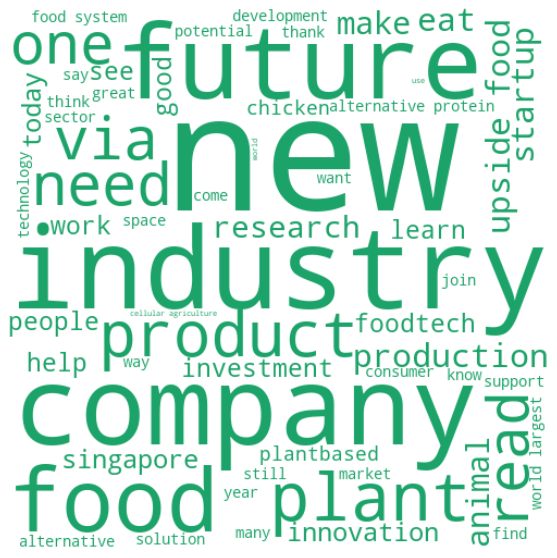

In [61]:
text = " ".join(i for i in dataset_label3_2022.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 4 (cultured meat) overall word cloud (Fig. 3D)

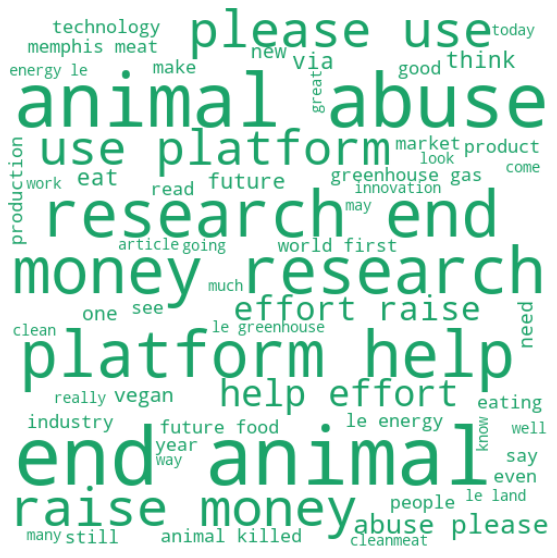

In [62]:
text = " ".join(i for i in dataset_label4.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 4 (cultured meat) yearly word clouds (supplementary material Fig. 6)

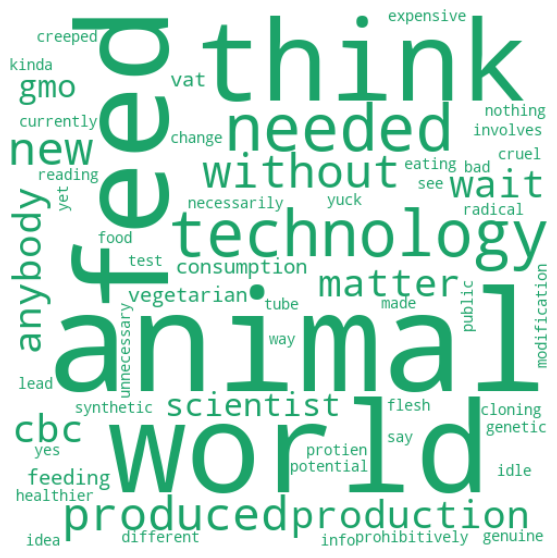

In [63]:
text = " ".join(i for i in dataset_label4_2010.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

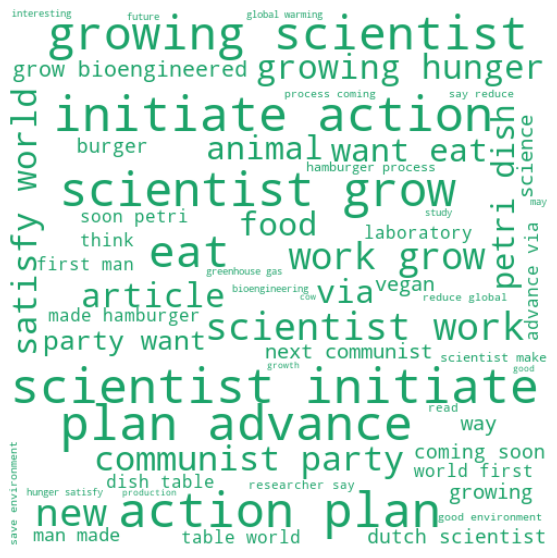

In [64]:
text = " ".join(i for i in dataset_label4_2011.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

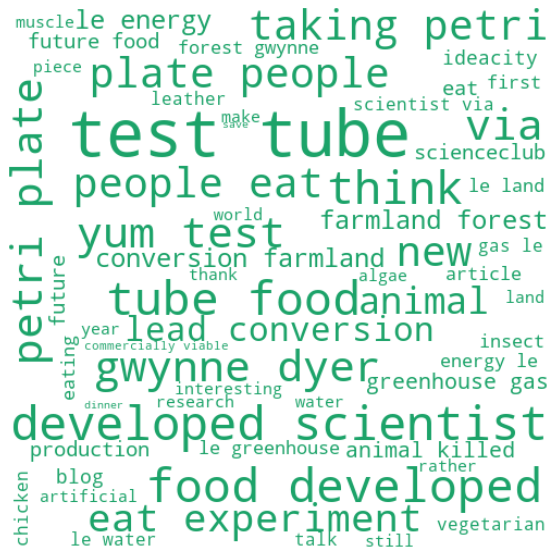

In [65]:
text = " ".join(i for i in dataset_label4_2012.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

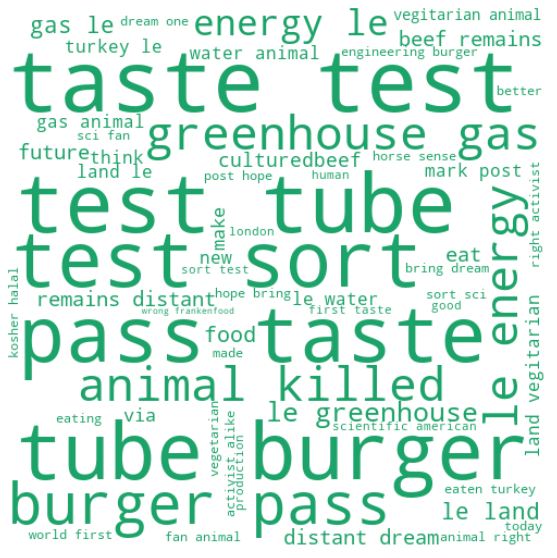

In [66]:
text = " ".join(i for i in dataset_label4_2013.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

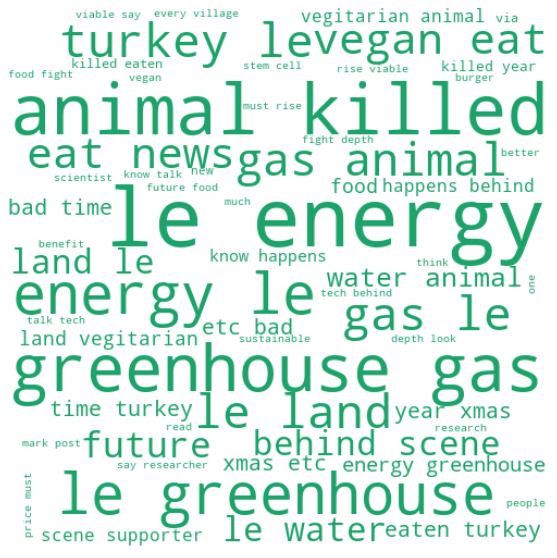

In [67]:
text = " ".join(i for i in dataset_label4_2014.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

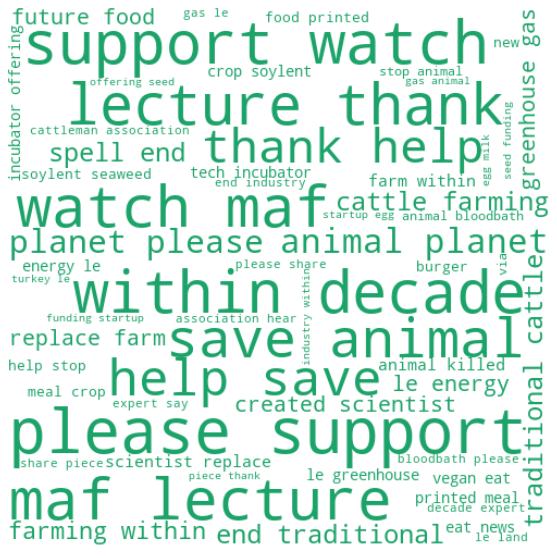

In [68]:
text = " ".join(i for i in dataset_label4_2015.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

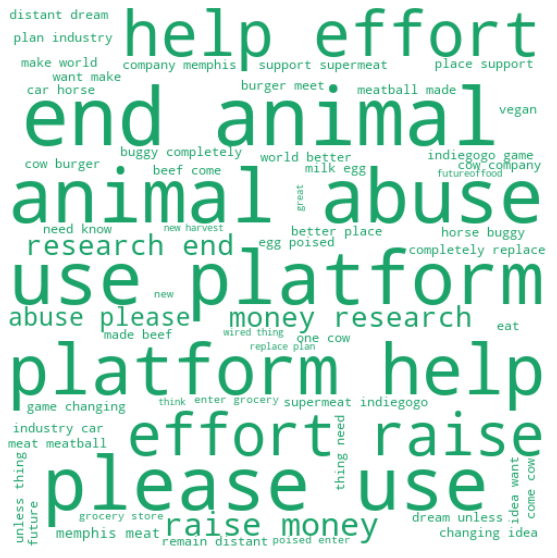

In [69]:
text = " ".join(i for i in dataset_label4_2016.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

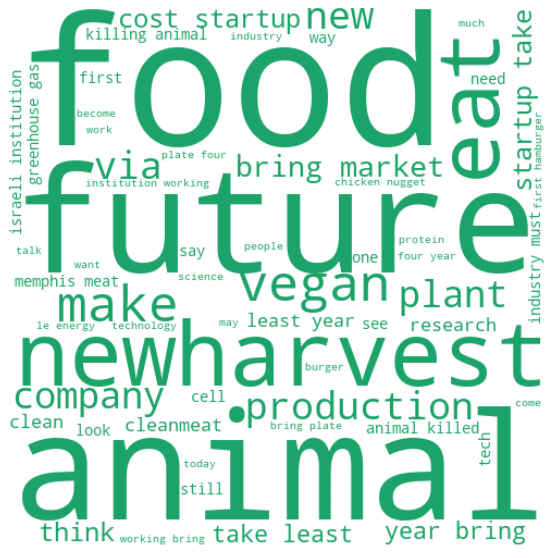

In [70]:
text = " ".join(i for i in dataset_label4_2017.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

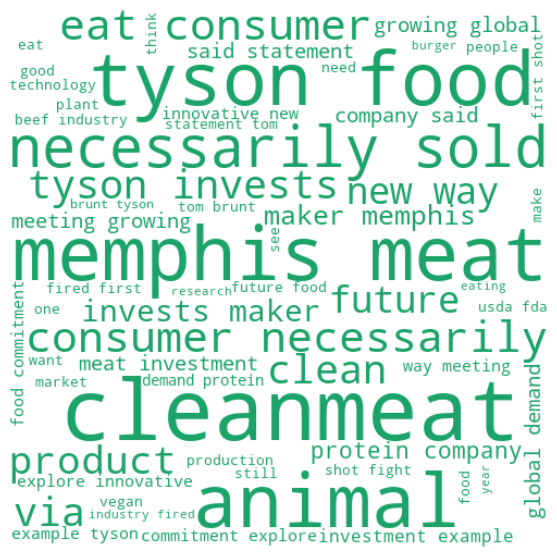

In [71]:
text = " ".join(i for i in dataset_label4_2018.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

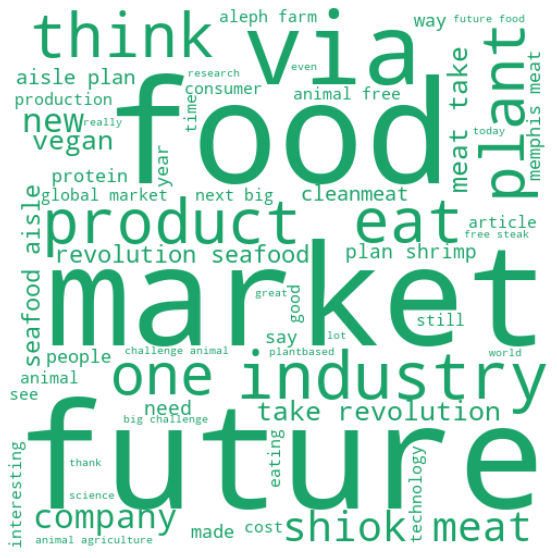

In [72]:
text = " ".join(i for i in dataset_label4_2019.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

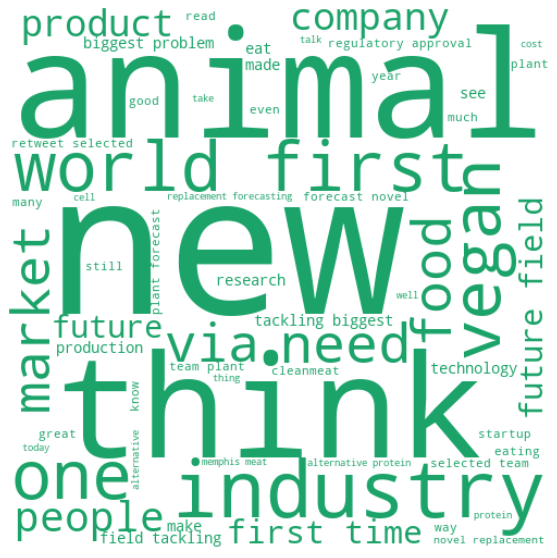

In [73]:
text = " ".join(i for i in dataset_label4_2020.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

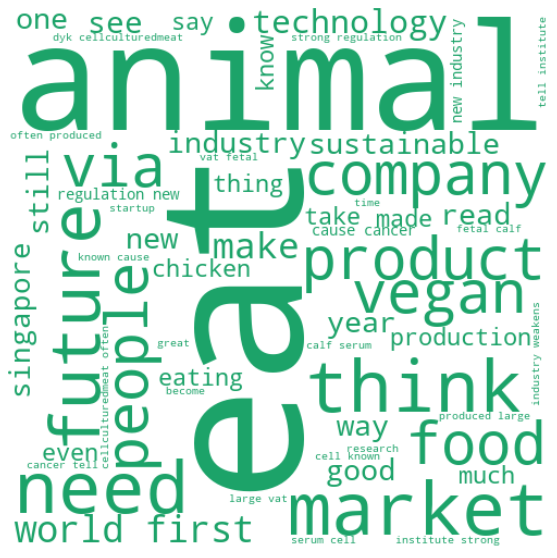

In [74]:
text = " ".join(i for i in dataset_label4_2021.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

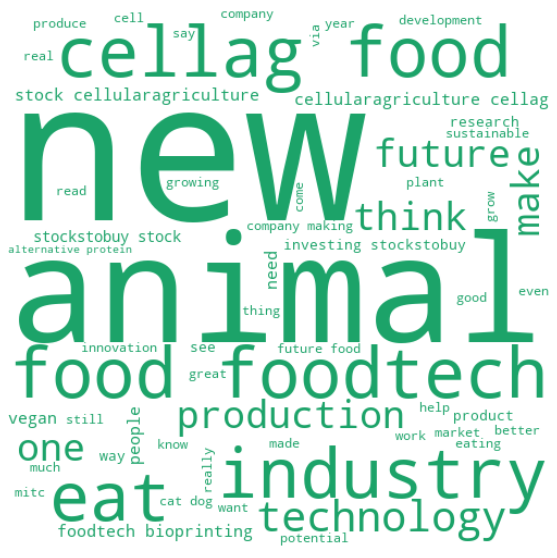

In [75]:
text = " ".join(i for i in dataset_label4_2022.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 5 (lab-grown meat) overall word cloud (Fig. 3E)

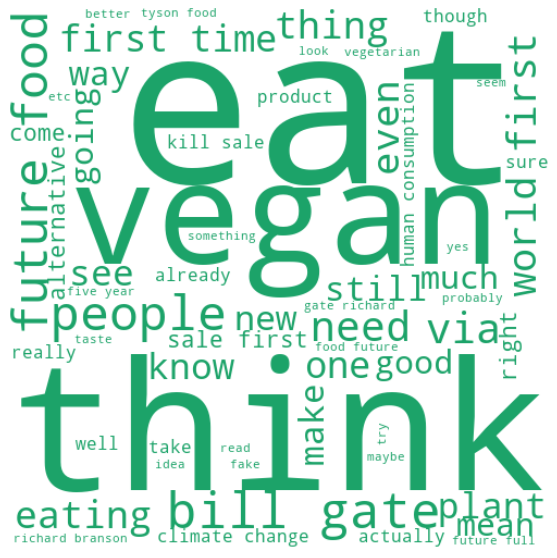

In [76]:
text = " ".join(i for i in dataset_label5.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Label 5 (lab-grown meat) yearly word clouds (supplementary material Fig. 7)

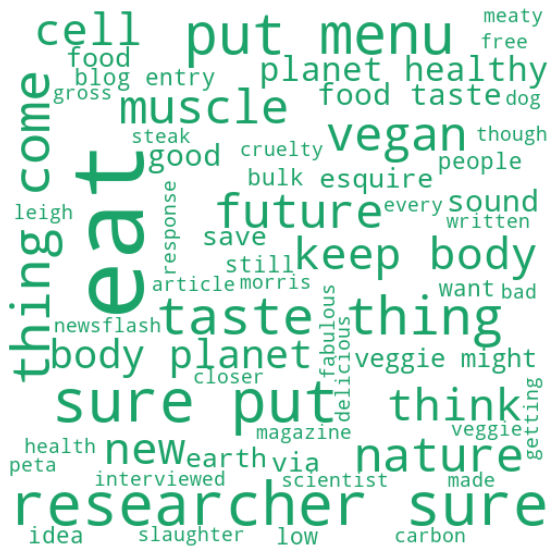

In [77]:
text = " ".join(i for i in dataset_label5_2010.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

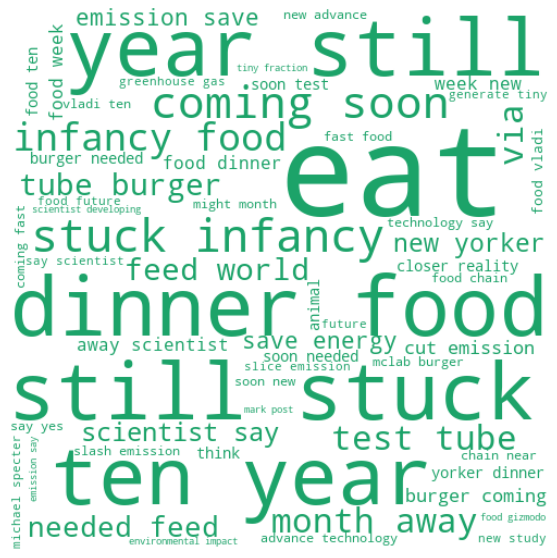

In [78]:
text = " ".join(i for i in dataset_label5_2011.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

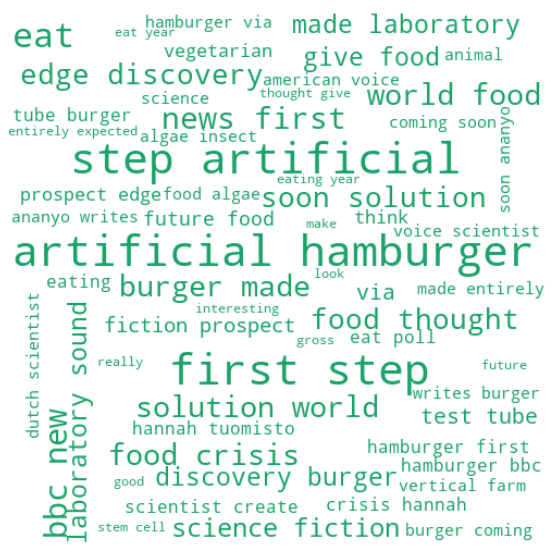

In [79]:
text = " ".join(i for i in dataset_label5_2012.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

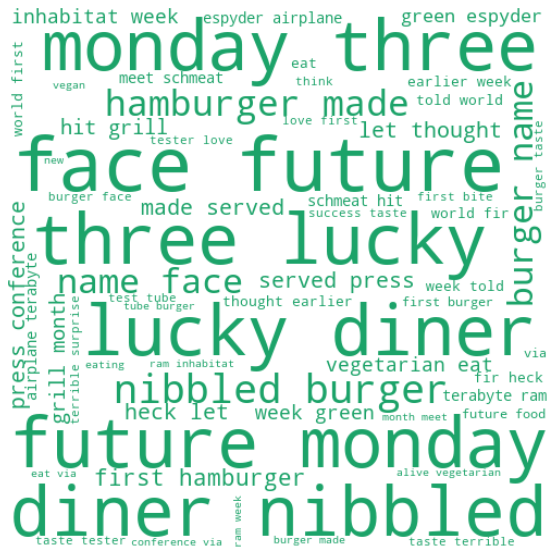

In [80]:
text = " ".join(i for i in dataset_label5_2013.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

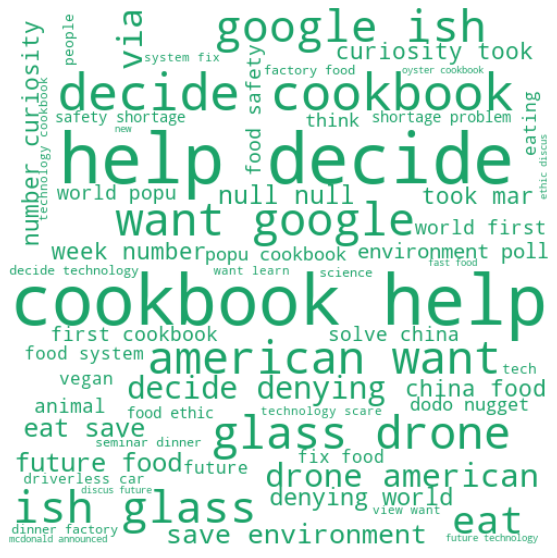

In [81]:
text = " ".join(i for i in dataset_label5_2014.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

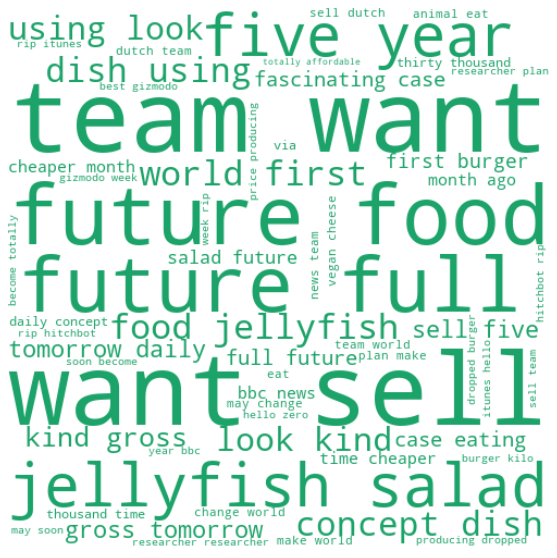

In [82]:
text = " ".join(i for i in dataset_label5_2015.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

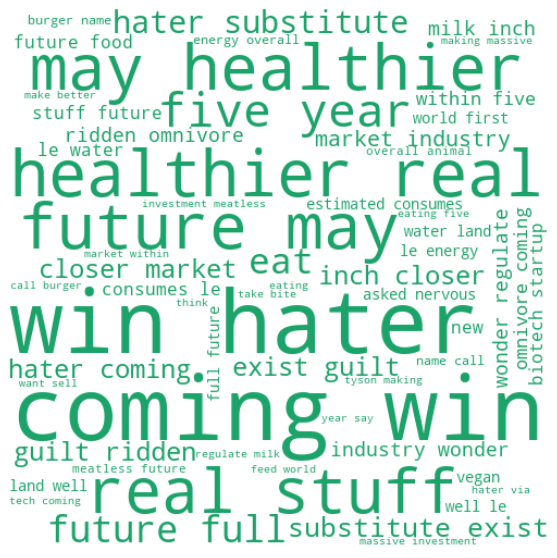

In [83]:
text = " ".join(i for i in dataset_label5_2016.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

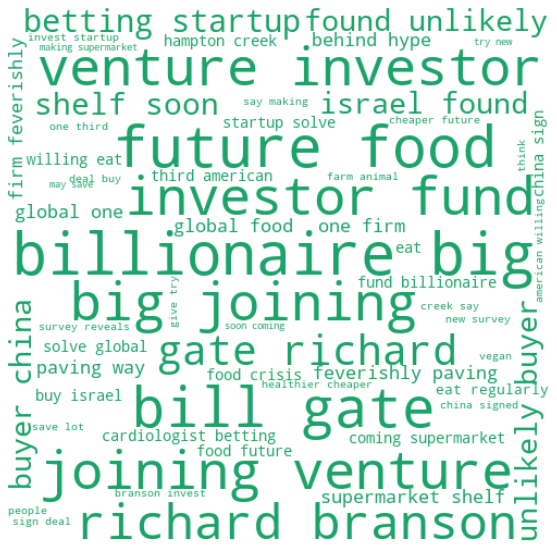

In [84]:
text = " ".join(i for i in dataset_label5_2017.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

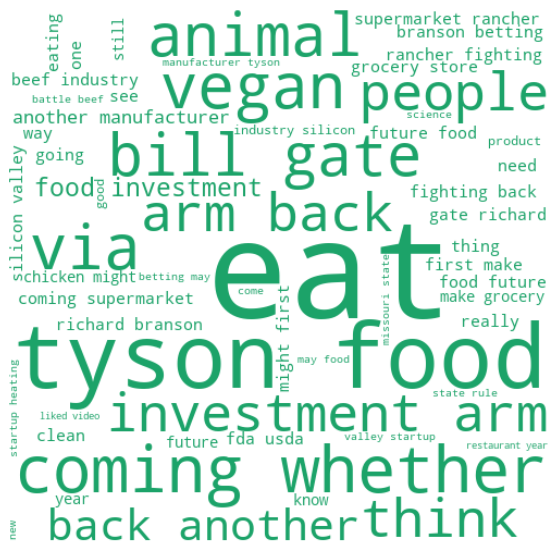

In [85]:
text = " ".join(i for i in dataset_label5_2018.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

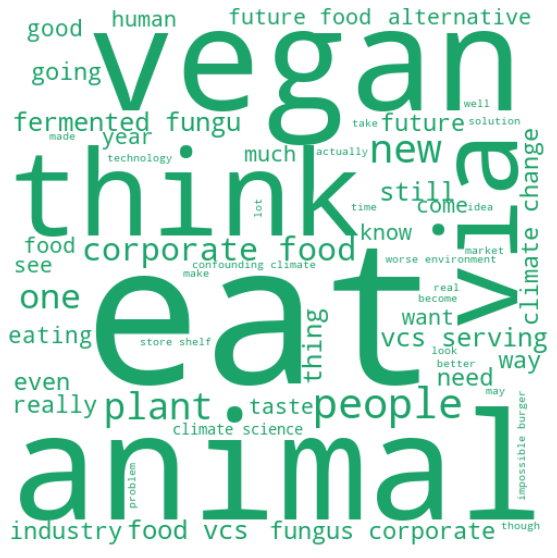

In [86]:
text = " ".join(i for i in dataset_label5_2019.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

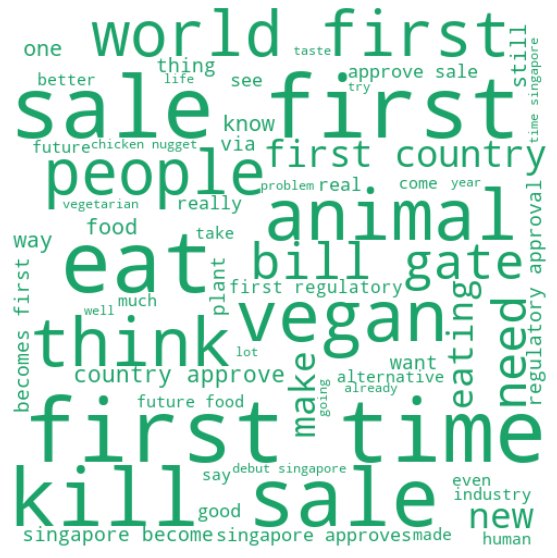

In [87]:
text = " ".join(i for i in dataset_label5_2020.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

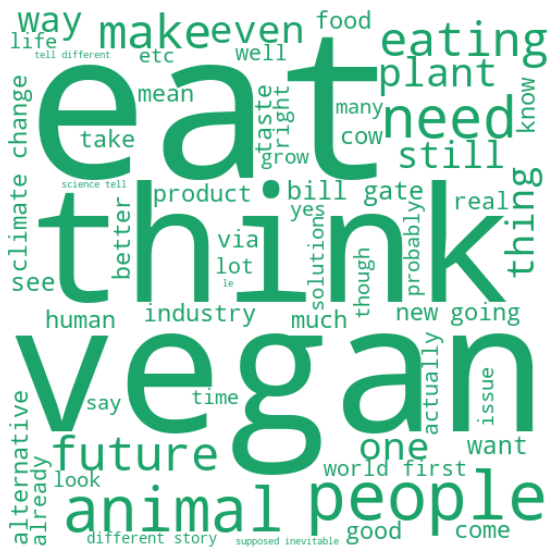

In [88]:
text = " ".join(i for i in dataset_label5_2021.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

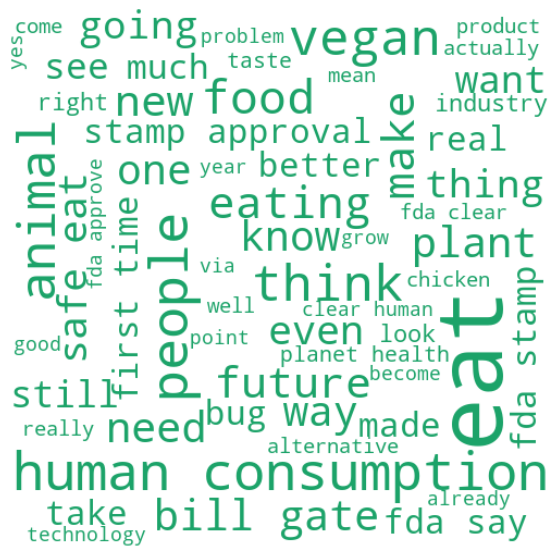

In [89]:
text = " ".join(i for i in dataset_label5_2022.processed)
def single_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "#1ca369"
cloud = WordCloud(max_words=60,width = 500, height = 500,
                background_color ='white',color_func=single_color_func).generate(text)
plt.figure(figsize=(10,10))
plt.imshow(cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Social network analysis (SNA)
### SNA was performed using Gephi

In [90]:
RT_singlelabel

label_1_index = []
label_2_index = []
label_3_index = []
label_4_index = []
label_5_index = []
for i,v in RT_singlelabel.iterrows():
    #print(v['processed for label'])
    if  "in vitro meat" in v['processed for label'] or 'invitromeat' in v['processed for label'] or 'invitro meat' in v['processed for label']:
        label_1_index.append(i)
    if  "cell based meat" in v['processed for label'] or 'cellbasedmeat' in v['processed for label'] or 'cellbased meat' in v['processed for label']:
        label_2_index.append(i)

    if "cultivated meat" in v['processed for label'] or 'cultivatedmeat'  in v['processed for label']:
        label_3_index.append(i)

    if "cultured meat" in v['processed for label'] or 'culturedmeat' in v['processed for label']:
        label_4_index.append(i)

    if "lab grown meat" in v['processed for label'] or 'labgrownmeat' in v['processed for label'] or 'labgrown meat' in v['processed for label']:
        label_5_index.append(i)


In [91]:
RT_singlelabel['label'] = 0
RT_singlelabel.loc[label_1_index,'label'] = 1
RT_singlelabel.loc[label_2_index,'label'] = 2
RT_singlelabel.loc[label_3_index,'label'] = 3
RT_singlelabel.loc[label_4_index,'label'] = 4
RT_singlelabel.loc[label_5_index,'label'] = 5

In [92]:
RT_2010 = RT_singlelabel.loc[RT_singlelabel['Year']=='2010']
RT_2011 = RT_singlelabel.loc[RT_singlelabel['Year']=='2011']
RT_2012 = RT_singlelabel.loc[RT_singlelabel['Year']=='2012']
RT_2013 = RT_singlelabel.loc[RT_singlelabel['Year']=='2013']
RT_2014 = RT_singlelabel.loc[RT_singlelabel['Year']=='2014']
RT_2015 = RT_singlelabel.loc[RT_singlelabel['Year']=='2015']
RT_2016 = RT_singlelabel.loc[RT_singlelabel['Year']=='2016']
RT_2017 = RT_singlelabel.loc[RT_singlelabel['Year']=='2017']
RT_2018 = RT_singlelabel.loc[RT_singlelabel['Year']=='2018']
RT_2019 = RT_singlelabel.loc[RT_singlelabel['Year']=='2019']
RT_2020 = RT_singlelabel.loc[RT_singlelabel['Year']=='2020']
RT_2021 = RT_singlelabel.loc[RT_singlelabel['Year']=='2021']
RT_2022 = RT_singlelabel.loc[RT_singlelabel['Year']=='2022']

In [93]:
def findsource(df):
    Source = []
    for i, v in df.iterrows():
        Source.append(v['Title'].split()[1].replace(':',''))
    return Source

RT2022 = pd.DataFrame()
RT2022['Target'] = [i for i in findsource(RT_2022)]
RT2022['Source'] = [('@'+i) for i in RT_2022['Author']]
RT2022['Label'] = [i for i in RT_2022['label']]

RT2021 = pd.DataFrame()
RT2021['Target'] = [i for i in findsource(RT_2021)]
RT2021['Source'] = [('@'+i) for i in RT_2021['Author']]
RT2021['Label'] = [i for i in RT_2021['label']]

RT2020 = pd.DataFrame()
RT2020['Target'] = [i for i in findsource(RT_2020)]
RT2020['Source'] = [('@'+i) for i in RT_2020['Author']]
RT2020['Label'] = [i for i in RT_2020['label']]

RT2019 = pd.DataFrame()
RT2019['Target'] = [i for i in findsource(RT_2019)]
RT2019['Source'] = [('@'+i) for i in RT_2019['Author']]
RT2019['Label'] = [i for i in RT_2019['label']]

RT2018 = pd.DataFrame()
RT2018['Target'] = [i for i in findsource(RT_2018)]
RT2018['Source'] = [('@'+i) for i in RT_2018['Author']]
RT2018['Label'] = [i for i in RT_2018['label']]

RT2017 = pd.DataFrame()
RT2017['Target'] = [i for i in findsource(RT_2017)]
RT2017['Source'] = [('@'+i) for i in RT_2017['Author']]
RT2017['Label'] = [i for i in RT_2017['label']]

RT2016 = pd.DataFrame()
RT2016['Target'] = [i for i in findsource(RT_2016)]
RT2016['Source'] = [('@'+i) for i in RT_2016['Author']]
RT2016['Label'] = [i for i in RT_2016['label']]

RT2015 = pd.DataFrame()
RT2015['Target'] = [i for i in findsource(RT_2015)]
RT2015['Source'] = [('@'+i) for i in RT_2015['Author']]
RT2015['Label'] = [i for i in RT_2015['label']]

RT2014 = pd.DataFrame()
RT2014['Target'] = [i for i in findsource(RT_2014)]
RT2014['Source'] = [('@'+i) for i in RT_2014['Author']]
RT2014['Label'] = [i for i in RT_2014['label']]

RT2013 = pd.DataFrame()
RT2013['Target'] = [i for i in findsource(RT_2013)]
RT2013['Source'] = [('@'+i) for i in RT_2013['Author']]
RT2013['Label'] = [i for i in RT_2013['label']]

RT2012 = pd.DataFrame()
RT2012['Target'] = [i for i in findsource(RT_2012)]
RT2012['Source'] = [('@'+i) for i in RT_2012['Author']]
RT2012['Label'] = [i for i in RT_2012['label']]

RT2011 = pd.DataFrame()
RT2011['Target'] = [i for i in findsource(RT_2011)]
RT2011['Source'] = [('@'+i) for i in RT_2011['Author']]
RT2011['Label'] = [i for i in RT_2011['label']]

RT2010 = pd.DataFrame()
RT2010['Target'] = [i for i in findsource(RT_2010)]
RT2010['Source'] = [('@'+i) for i in RT_2010['Author']]
RT2010['Label'] = [i for i in RT_2010['label']]